In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-TE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835357,1499428835358,1,6,800,1499428835357,1499428835358,1,4,473,1499428835357,1499428835358,1,2,327,60,133.333333,109.302638,287,60,118.25,112.535550,287,66,163.5,137.885822,261,0,0.200000,0.447214,1,0,0.333333,0.57735,1,1,1.0,0.000000,1,2,0,0,0,5,2,0,1,1,0,0,0,3,1,0,1,1,0,0,0,2,1,0,0,BENIGN
1,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,6,4,0,1499428835358,1499428835358,0,2,120,1499428835358,1499428835358,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
2,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835374,1499428835375,1,7,2265,1499428835374,1499428835375,1,5,613,1499428835374,1499428835375,1,2,1652,60,323.571429,568.141372,1586,60,122.60,136.648454,367,66,826.0,1074.802307,1586,0,0.166667,0.408248,1,0,0.250000,0.50000,1,1,1.0,0.000000,1,2,0,0,0,6,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,2,1,0,0,BENIGN
3,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,6,4,0,1499428835375,1499428835375,0,2,120,1499428835375,1499428835375,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
4,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1033,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835416,1499428835417,1,8,3550,1499428835416,1499428835417,1,5,1852,1499428835416,1499428835417,1,3,1698,60,443.750000,706.926901,1606,60,370.40,690.726284,1606,60,566.0,871.226721,1572,0,0.142857,0.377964,1,0,0.250000,0.50000,1,0,0.5,0.707107,1,2,0,0,0,7,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,3,1,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3153360 entries, 0 to 3153359
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

In [4]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      83.71
PortScan                     7.34
DoS Hulk                     5.03
DDoS                         3.03
FTP-Patator                  0.25
DoS GoldenEye                0.25
DoS slowloris                0.16
SSH-Patator                  0.09
DoS Slowhttptest             0.09
Bot                          0.02
Web Attack - Brute Force     0.00
Infiltration                 0.00
Web Attack - XSS             0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [5]:
ds.label.value_counts()

label
BENIGN                        2639806
PortScan                       231572
DoS Hulk                       158546
DDoS                            95685
FTP-Patator                      7963
DoS GoldenEye                    7917
DoS slowloris                    5192
SSH-Patator                      2980
DoS Slowhttptest                 2732
Bot                               738
Web Attack - Brute Force          151
Infiltration                       28
Web Attack - XSS                   27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [6]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [7]:
sample_weights = ds.label.value_counts().to_dict()

In [8]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [23]:
params = {
    'iterations': 40,
    'depth': 9,
    'learning_rate': 0.1,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [26]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [27]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='weighted')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='weighted')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:
0:	learn: 1.7384294	total: 145ms	remaining: 5.64s
1:	learn: 1.3983141	total: 297ms	remaining: 5.65s
2:	learn: 1.1806161	total: 443ms	remaining: 5.46s
3:	learn: 1.0295316	total: 597ms	remaining: 5.37s
4:	learn: 0.9010124	total: 749ms	remaining: 5.24s
5:	learn: 0.8002760	total: 902ms	remaining: 5.11s
6:	learn: 0.7166402	total: 1.05s	remaining: 4.96s


7:	learn: 0.6469919	total: 1.21s	remaining: 4.86s
8:	learn: 0.5883158	total: 1.39s	remaining: 4.78s
9:	learn: 0.5339929	total: 1.56s	remaining: 4.67s
10:	learn: 0.4852494	total: 1.72s	remaining: 4.52s
11:	learn: 0.4433731	total: 1.87s	remaining: 4.36s
12:	learn: 0.4077712	total: 2.02s	remaining: 4.19s
13:	learn: 0.3749639	total: 2.17s	remaining: 4.03s
14:	learn: 0.3453816	total: 2.32s	remaining: 3.87s
15:	learn: 0.3199362	total: 2.48s	remaining: 3.72s
16:	learn: 0.2976804	total: 2.64s	remaining: 3.57s
17:	learn: 0.2786505	total: 2.8s	remaining: 3.42s
18:	learn: 0.2601398	total: 2.96s	remaining: 3.27s
19:	learn: 0.2429761	total: 3.11s	remaining: 3.11s
20:	learn: 0.2277391	total: 3.27s	remaining: 2.96s
21:	learn: 0.2143262	total: 3.42s	remaining: 2.8s
22:	learn: 0.2018956	total: 3.58s	remaining: 2.64s
23:	learn: 0.1901822	total: 3.73s	remaining: 2.48s
24:	learn: 0.1800843	total: 3.88s	remaining: 2.33s
25:	learn: 0.1708152	total: 4.03s	remaining: 2.17s
26:	learn: 0.1631915	total: 4.18s	re

In [28]:
%time cat.fit(X_train, y_train)

0:	learn: 1.7482711	total: 265ms	remaining: 10.3s
1:	learn: 1.4128374	total: 517ms	remaining: 9.82s
2:	learn: 1.1890747	total: 784ms	remaining: 9.67s
3:	learn: 1.0321251	total: 1.03s	remaining: 9.31s
4:	learn: 0.9112007	total: 1.3s	remaining: 9.1s
5:	learn: 0.8056271	total: 1.56s	remaining: 8.86s
6:	learn: 0.7224046	total: 1.84s	remaining: 8.69s
7:	learn: 0.6502946	total: 2.12s	remaining: 8.47s
8:	learn: 0.5916704	total: 2.39s	remaining: 8.24s
9:	learn: 0.5378249	total: 2.67s	remaining: 8.01s
10:	learn: 0.4889337	total: 2.96s	remaining: 7.79s
11:	learn: 0.4465733	total: 3.22s	remaining: 7.52s
12:	learn: 0.4114496	total: 3.5s	remaining: 7.28s
13:	learn: 0.3805751	total: 3.78s	remaining: 7.03s
14:	learn: 0.3506078	total: 4.07s	remaining: 6.78s
15:	learn: 0.3253928	total: 4.36s	remaining: 6.53s
16:	learn: 0.3015686	total: 4.64s	remaining: 6.29s
17:	learn: 0.2813257	total: 4.93s	remaining: 6.03s
18:	learn: 0.2638866	total: 5.24s	remaining: 5.79s
19:	learn: 0.2468788	total: 5.5s	remaining: 

In [29]:
%time y_predicted_train = cat.predict(X_train)
%time y_predicted_test = cat.predict(X_test)

CPU times: user 22.8 ms, sys: 2.96 ms, total: 25.7 ms
Wall time: 9.56 ms
CPU times: user 14.4 ms, sys: 991 µs, total: 15.4 ms
Wall time: 13.7 ms


In [30]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.985707,0.982917
1,PRECISION,0.985955,0.981971
2,RECALL,0.985707,0.982917
3,F1 SCORE,0.985463,0.981996


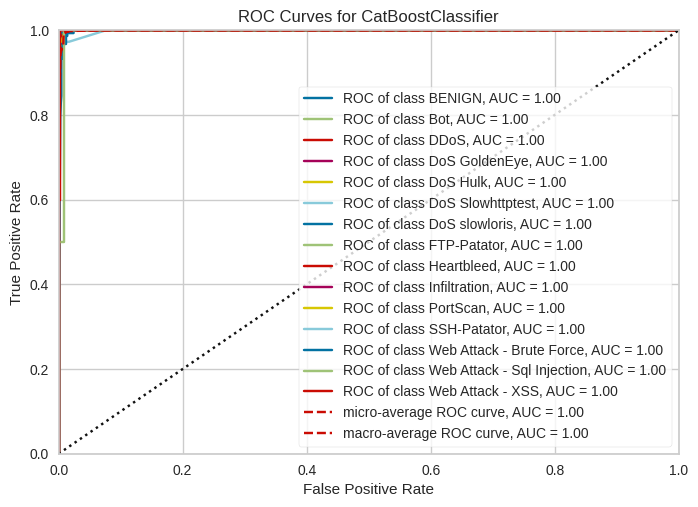

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [31]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

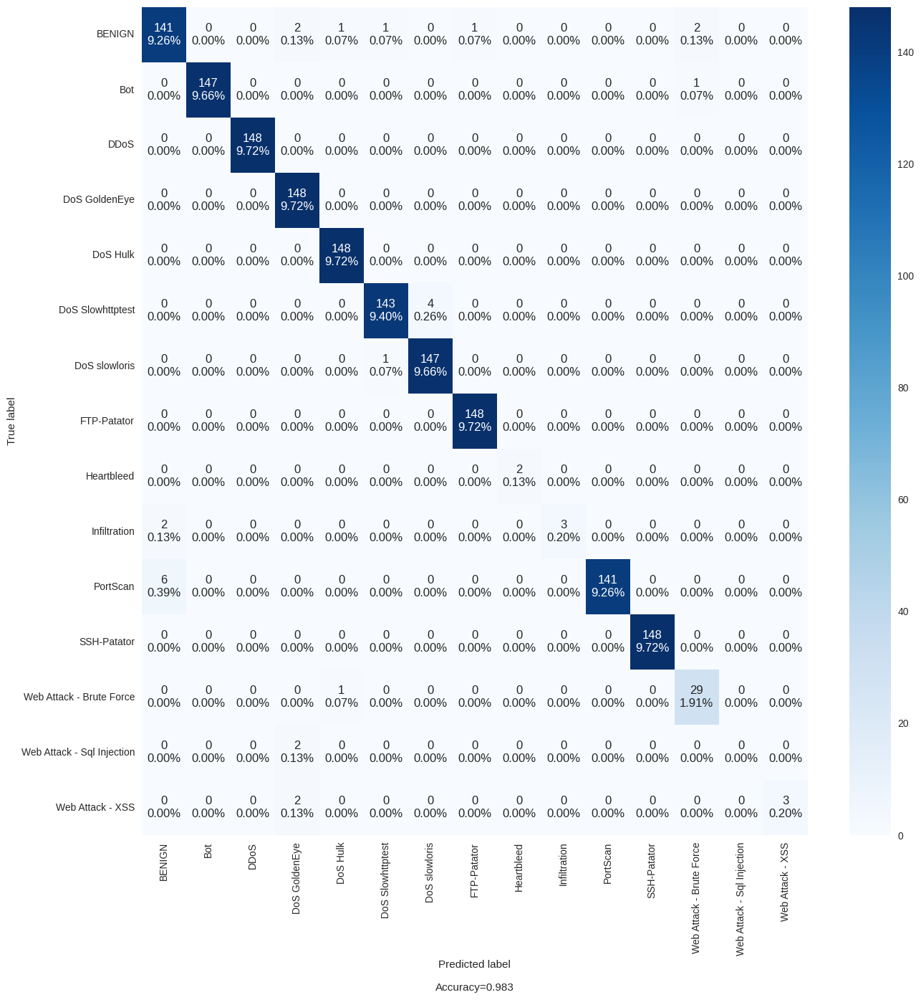

In [32]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

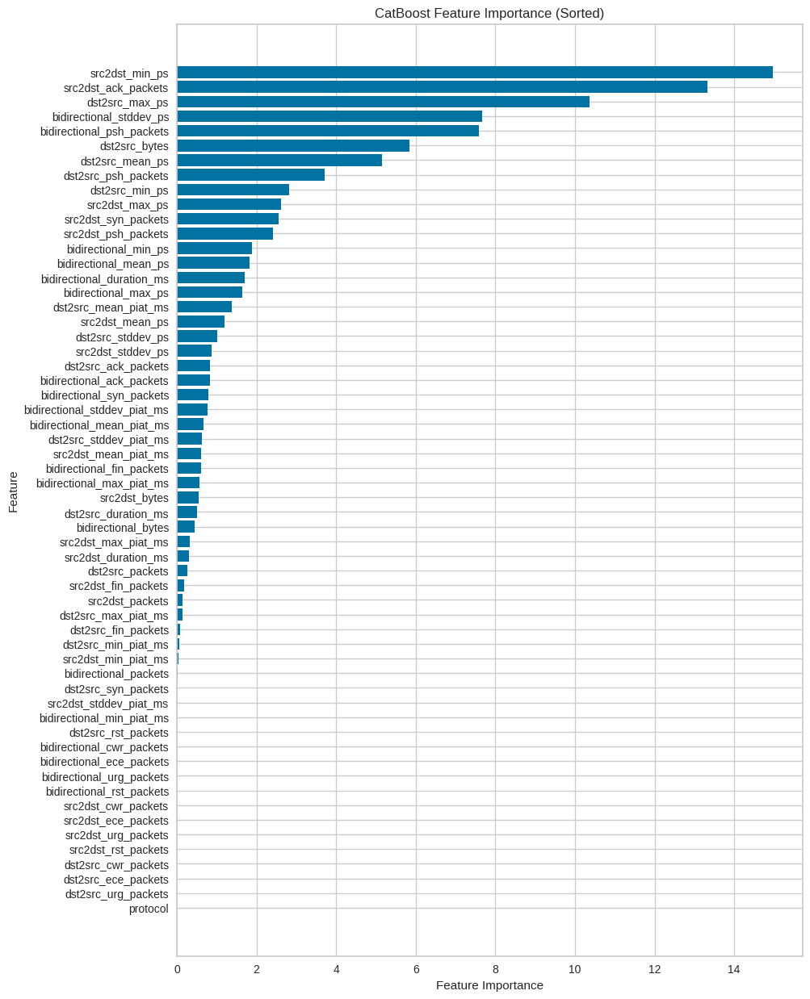

In [33]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [34]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 1min 11s, sys: 569 ms, total: 1min 12s
Wall time: 8.57 s


In [35]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

## Benign shap

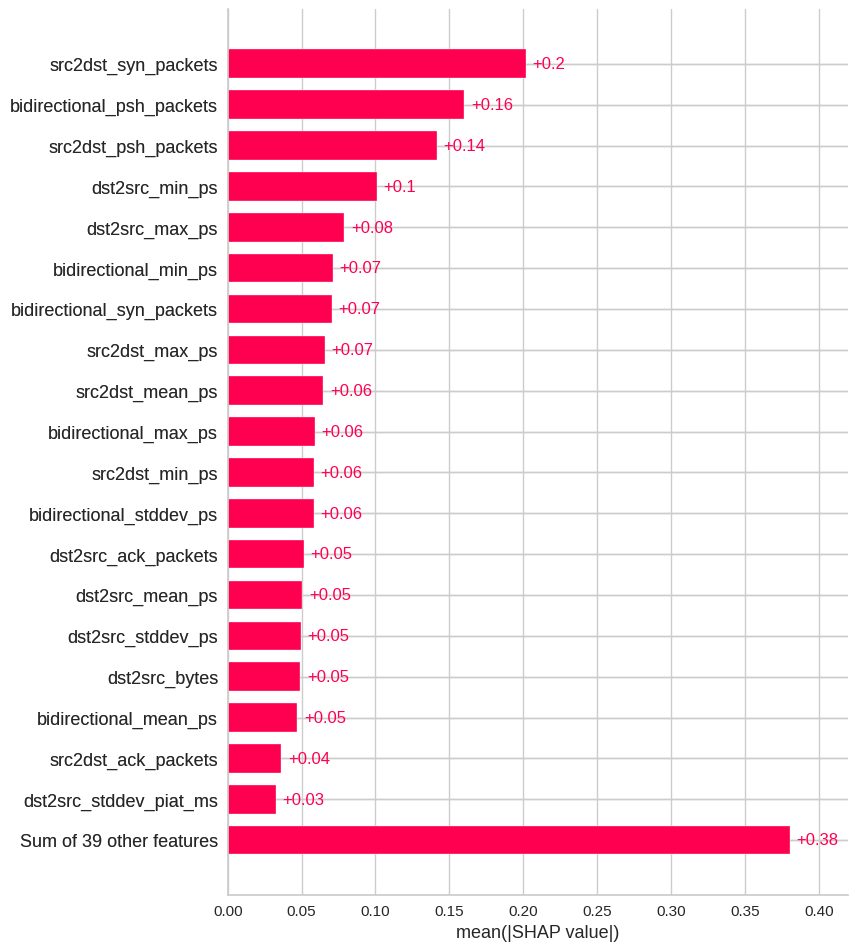

In [36]:
exp = Explanation(sv.values[:,:,0], 
                  sv.base_values[:,0], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

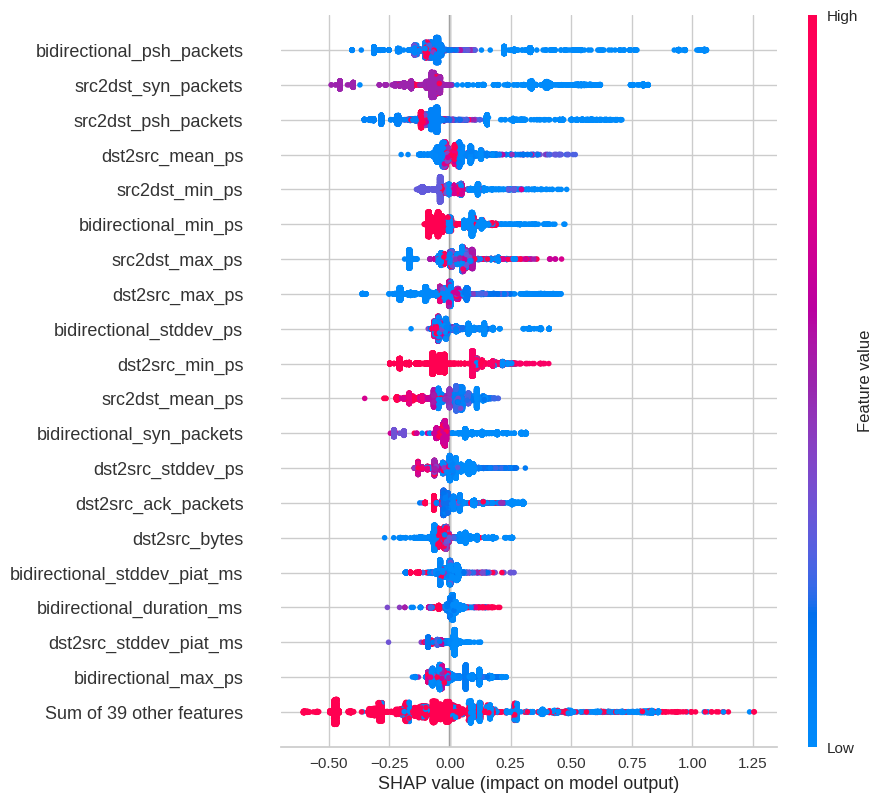

In [37]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

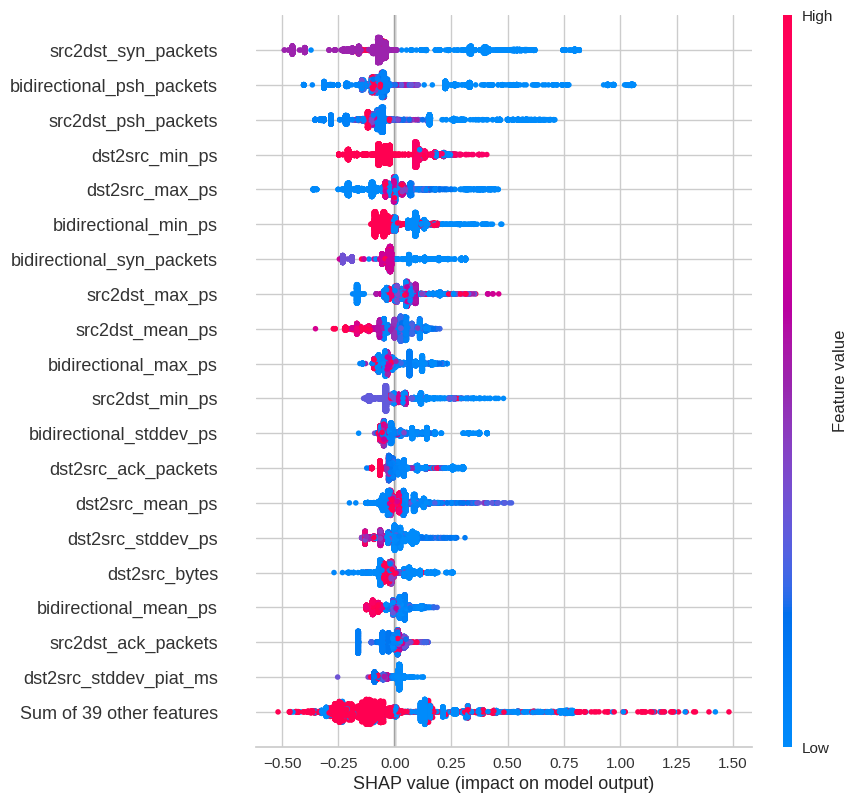

In [38]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Bot shap

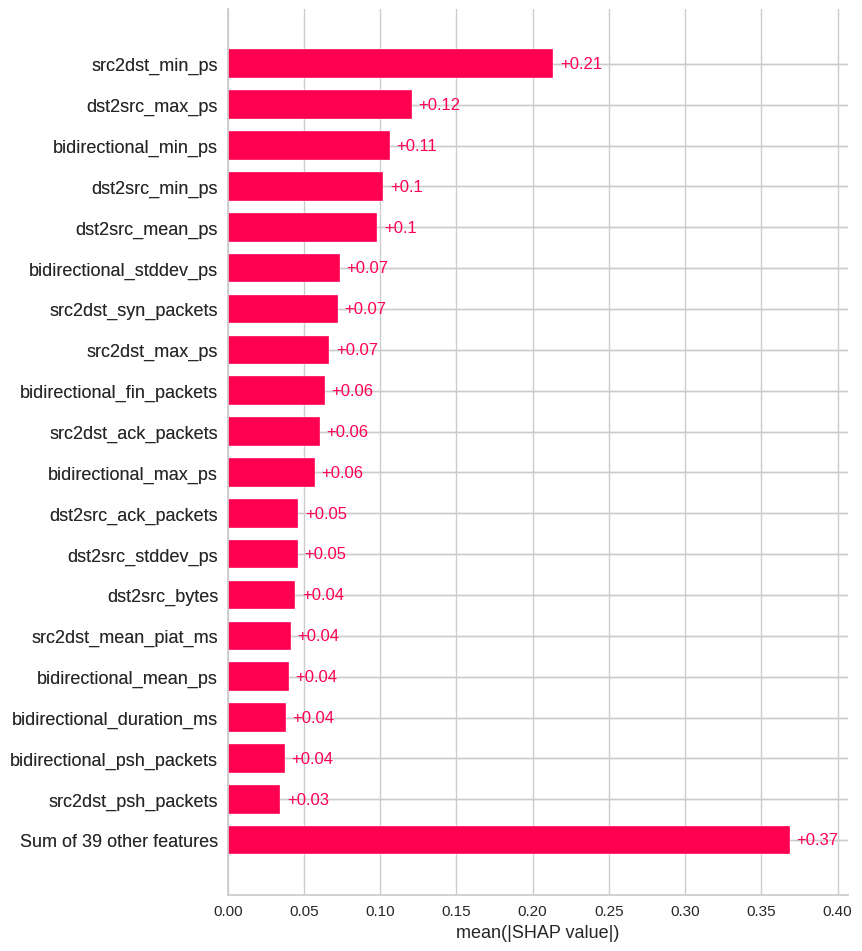

In [39]:
exp = Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

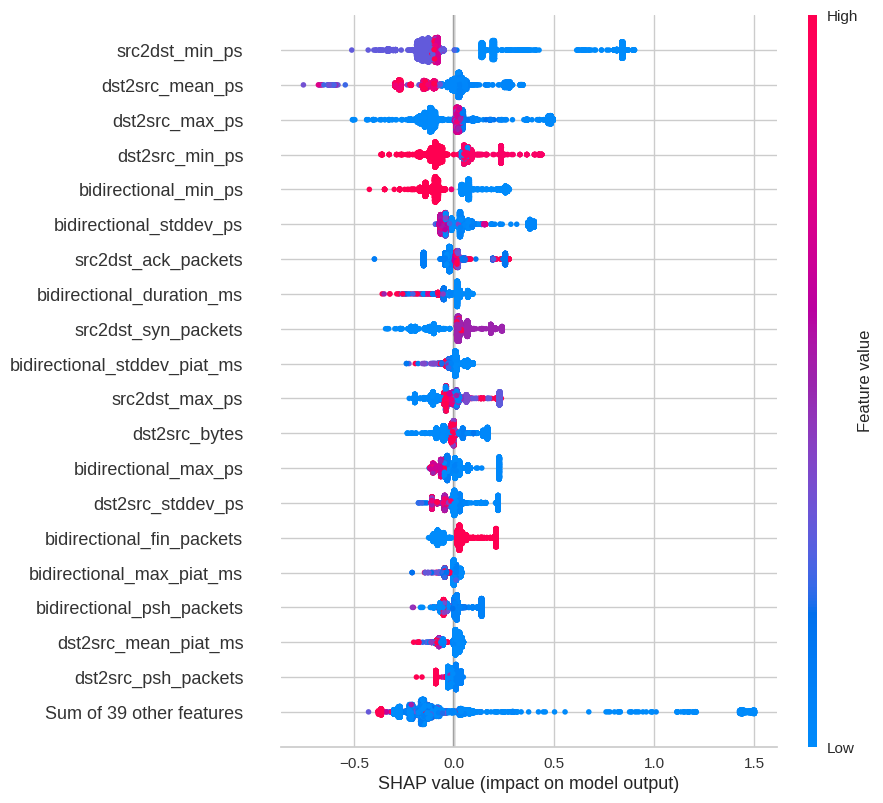

In [40]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

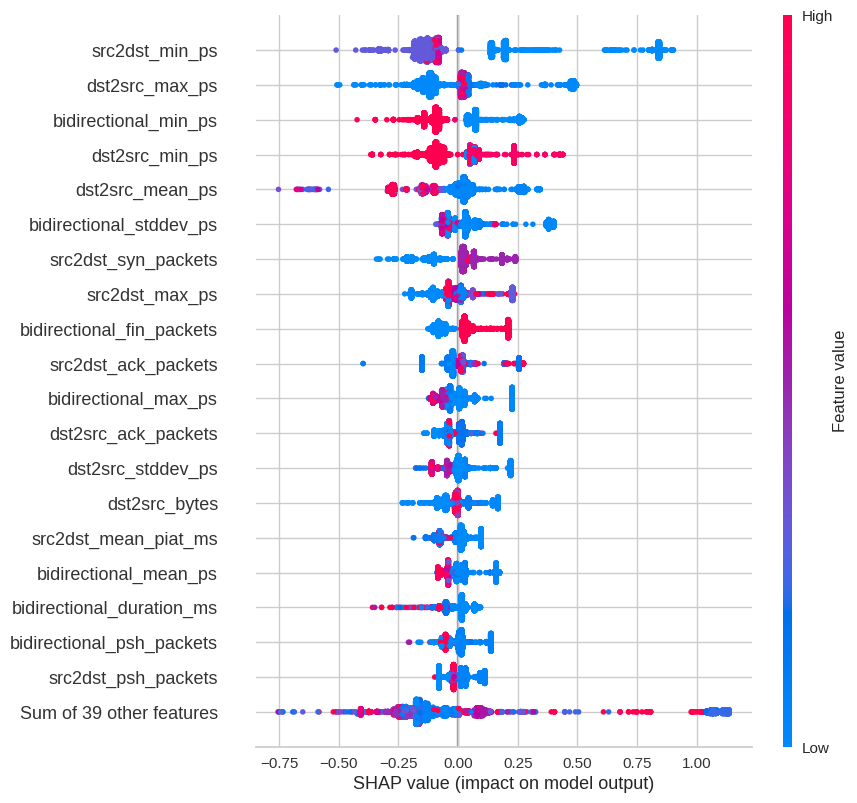

In [41]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DDoS shap

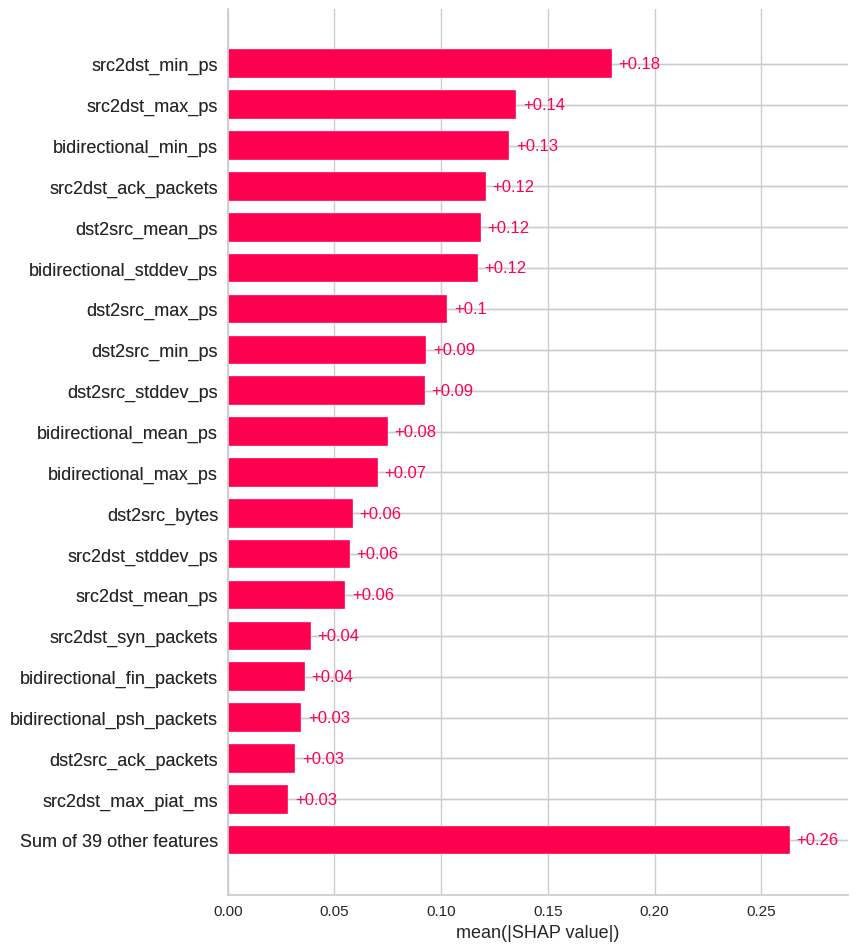

In [42]:
exp = Explanation(sv.values[:,:,2], 
                  sv.base_values[:,2], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

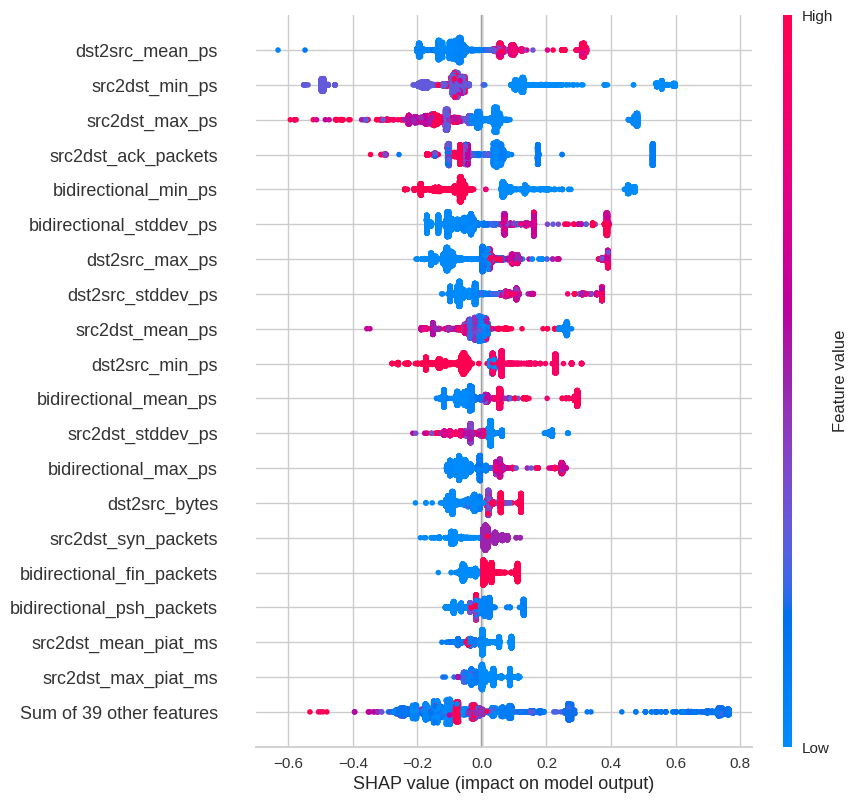

In [43]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

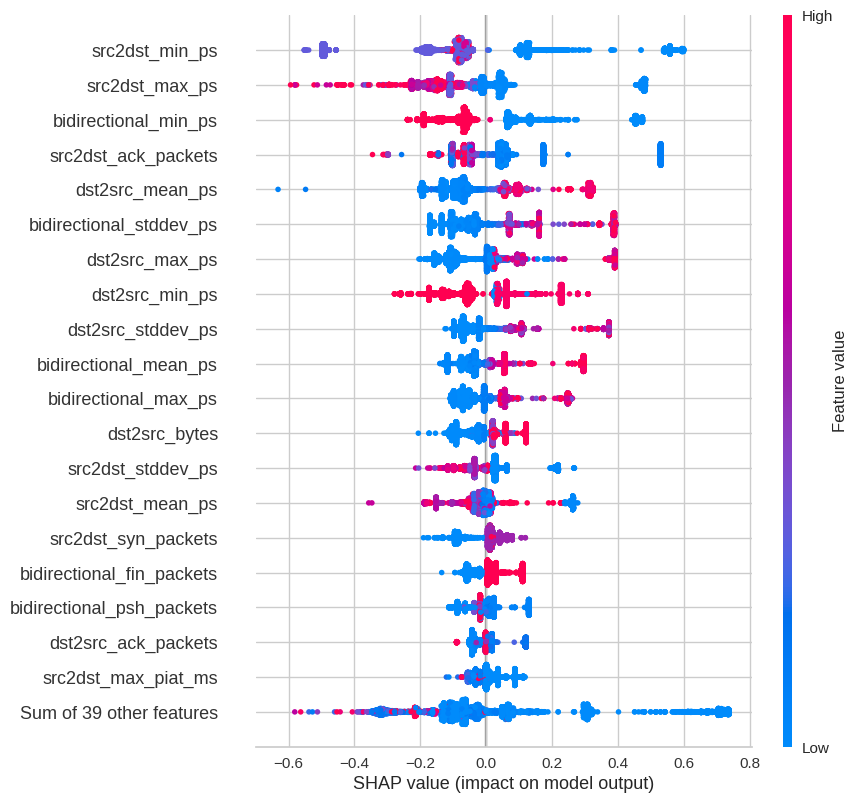

In [44]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS GoldenEye shap

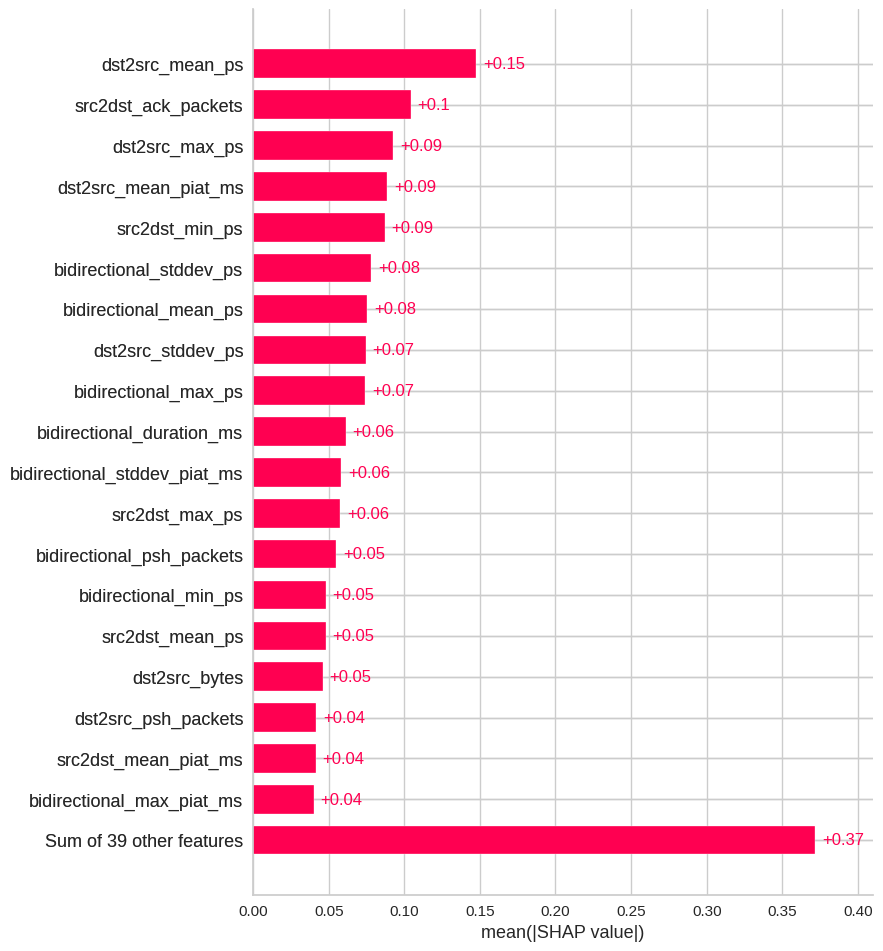

In [45]:
exp = Explanation(sv.values[:,:,3], 
                  sv.base_values[:,3], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

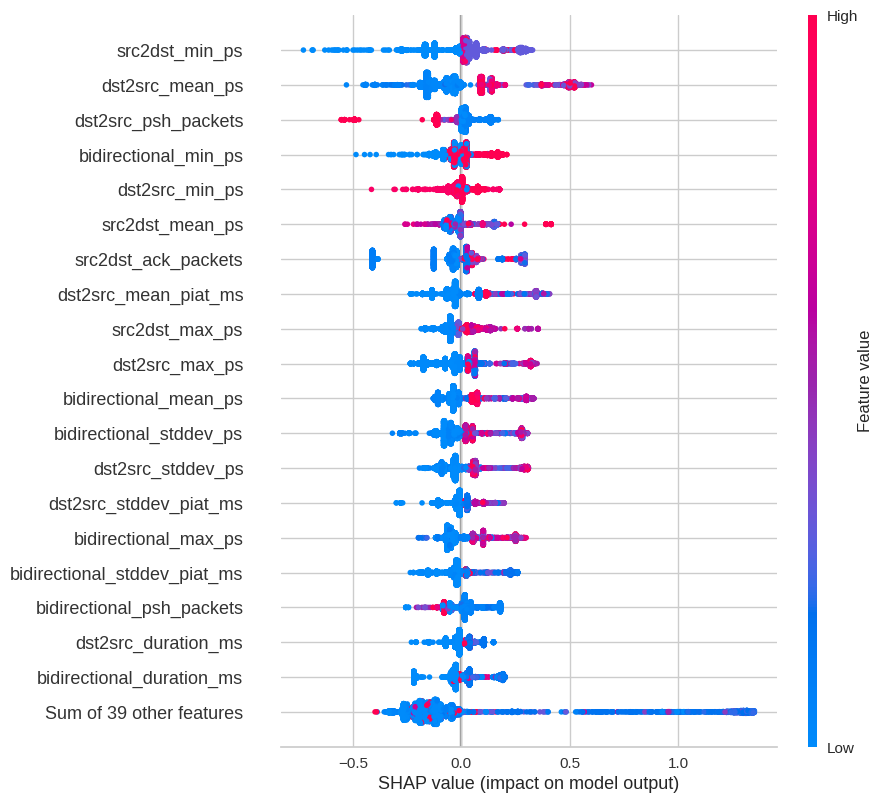

In [46]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

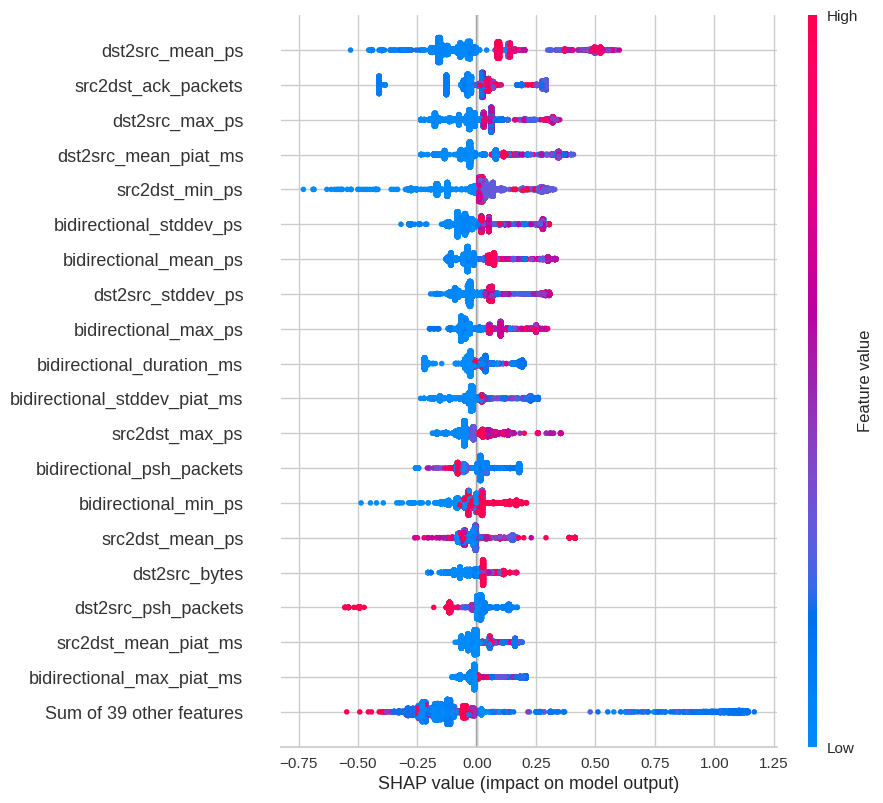

In [47]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Hulk shap

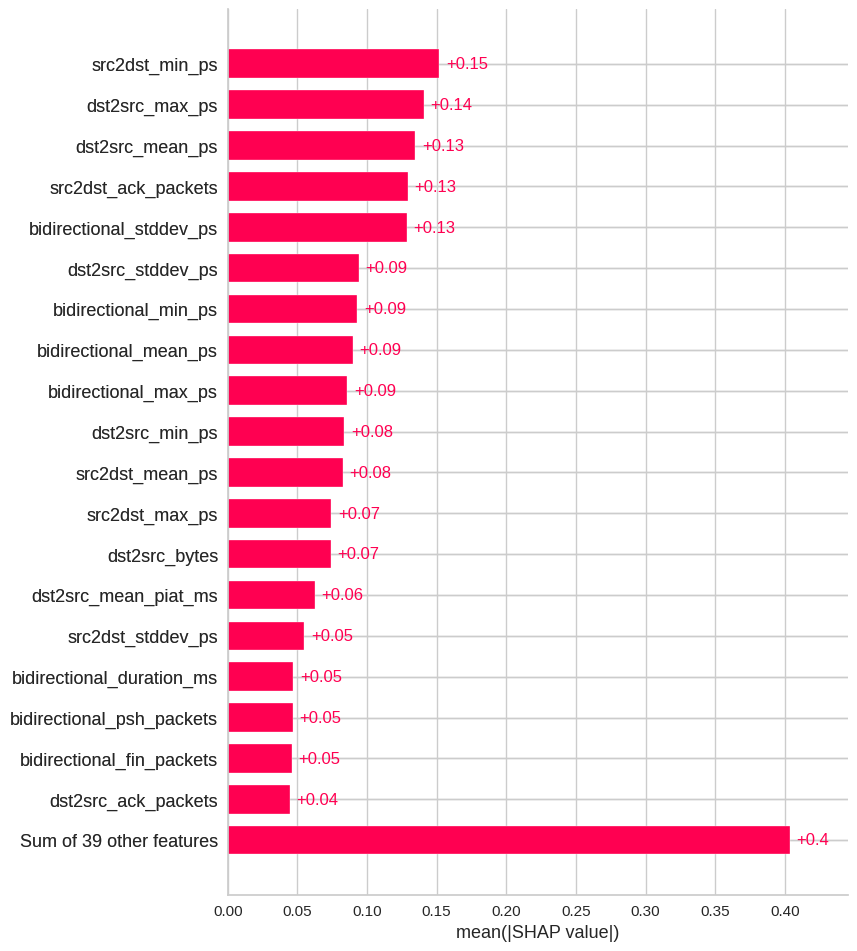

In [48]:
exp = Explanation(sv.values[:,:,4], 
                  sv.base_values[:,4], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

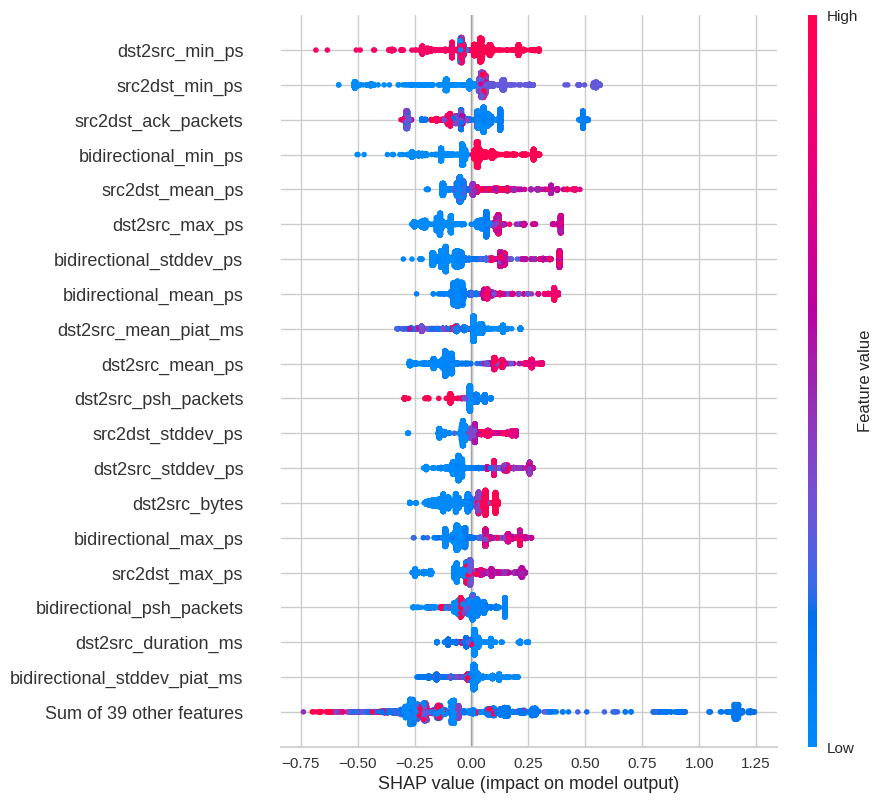

In [49]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

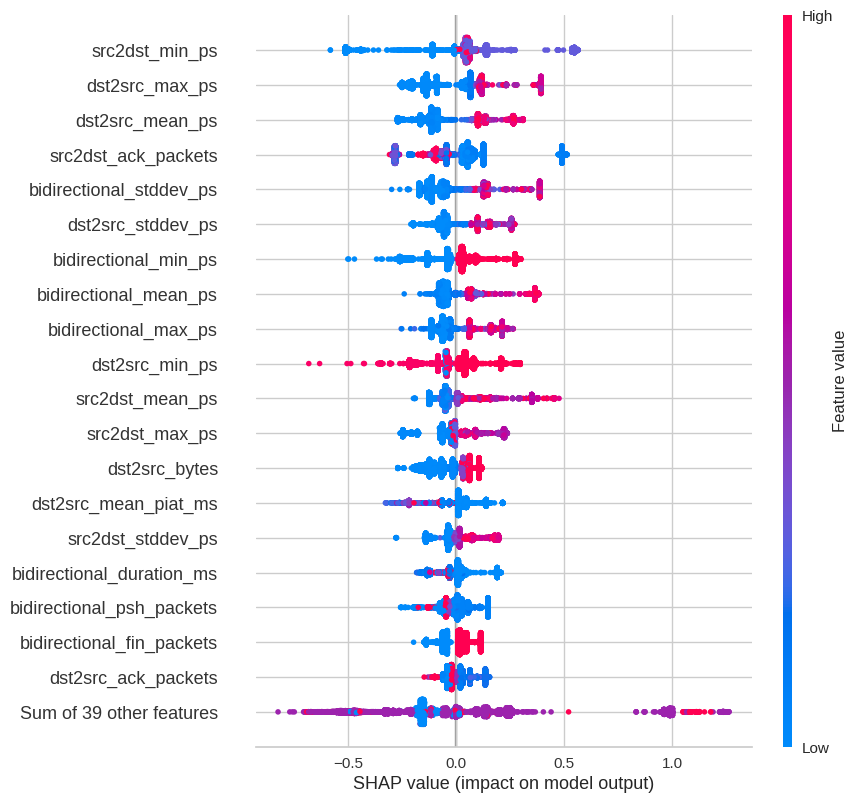

In [50]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Slowhttptest shap

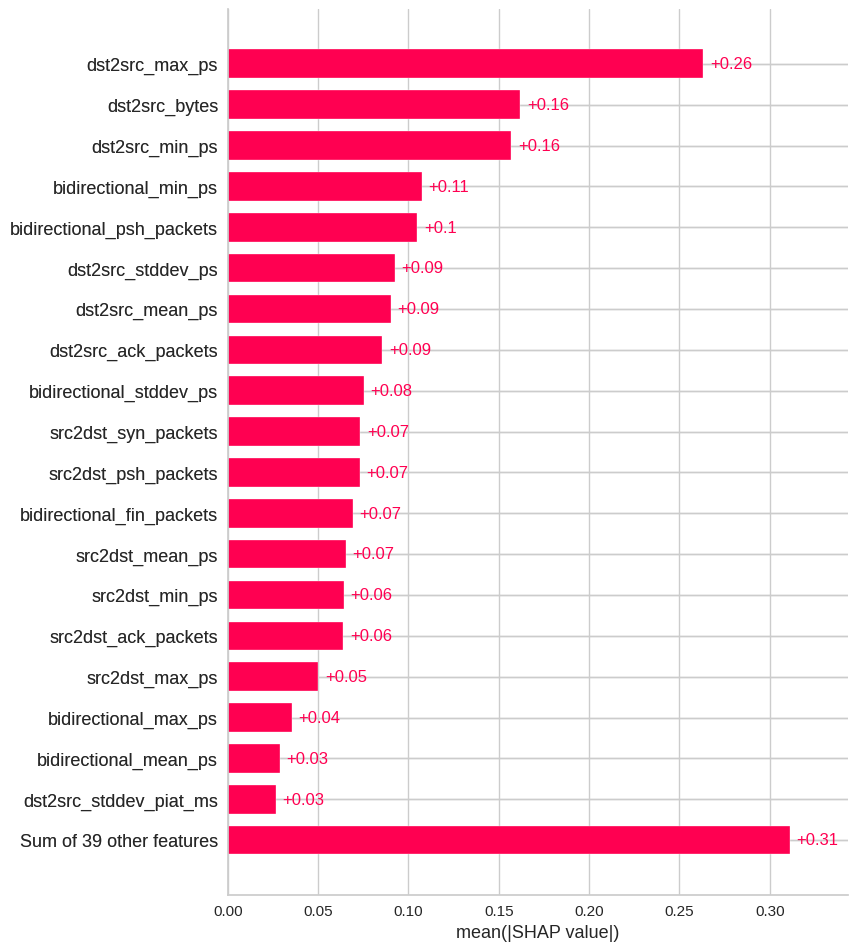

In [51]:
exp = Explanation(sv.values[:,:,5], 
                  sv.base_values[:,5], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

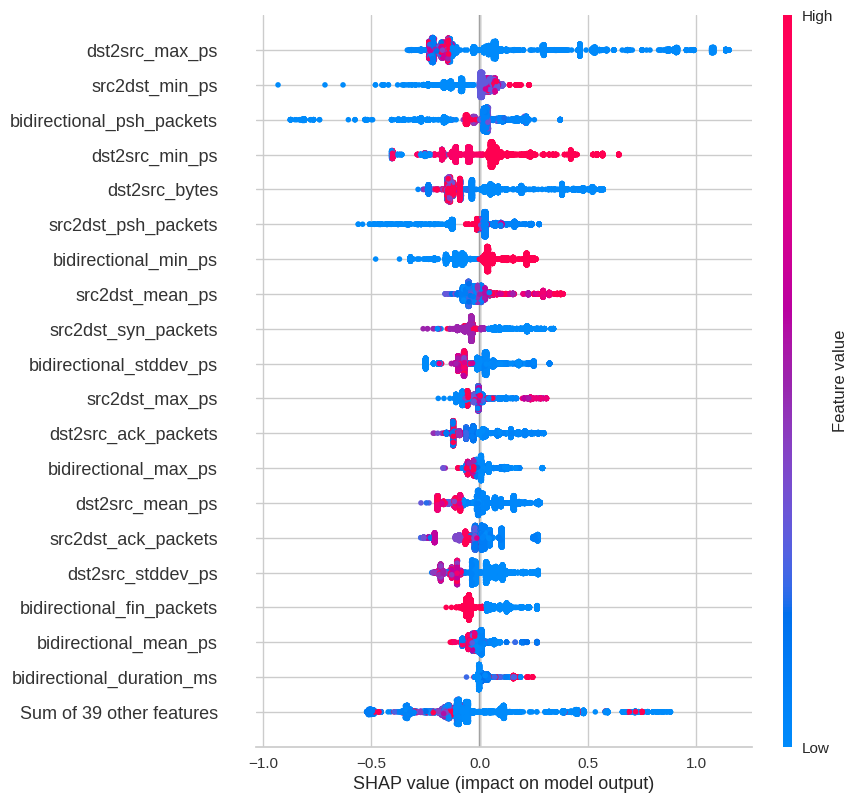

In [52]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

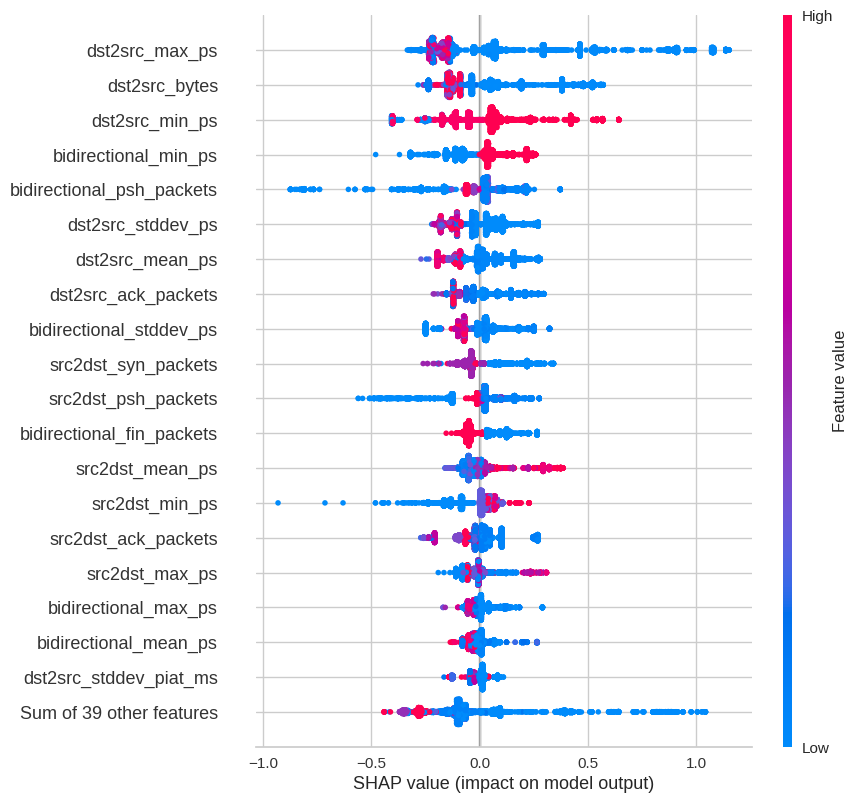

In [53]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS slowloris shap

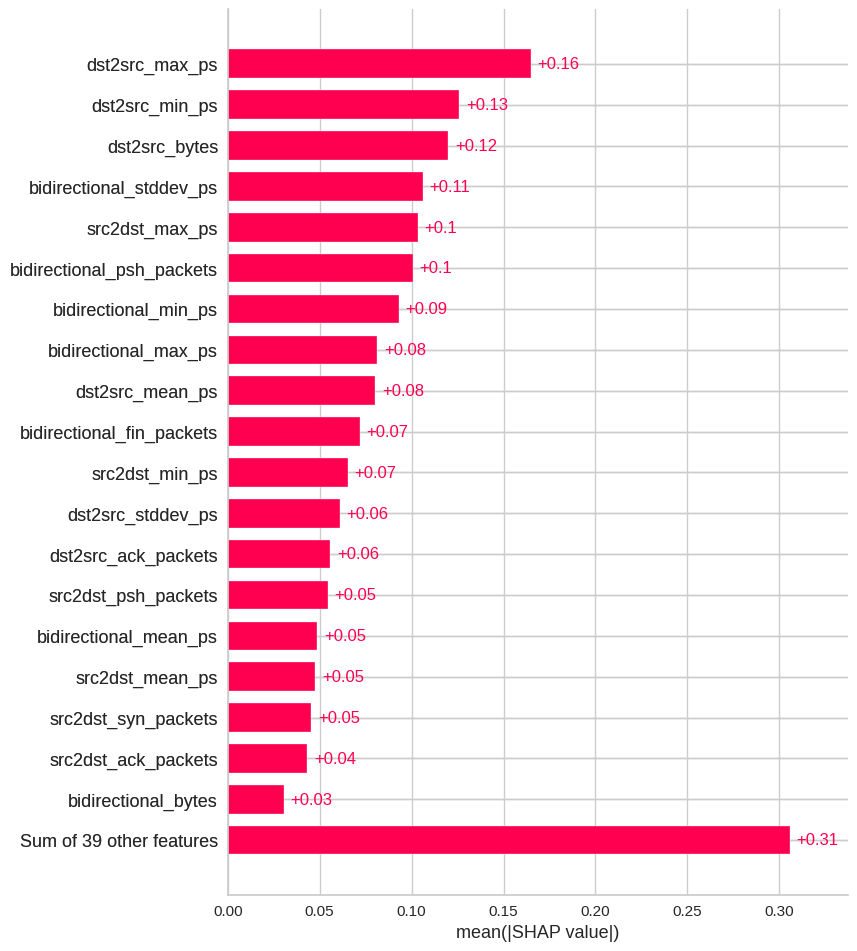

In [54]:
exp = Explanation(sv.values[:,:,6], 
                  sv.base_values[:,6], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

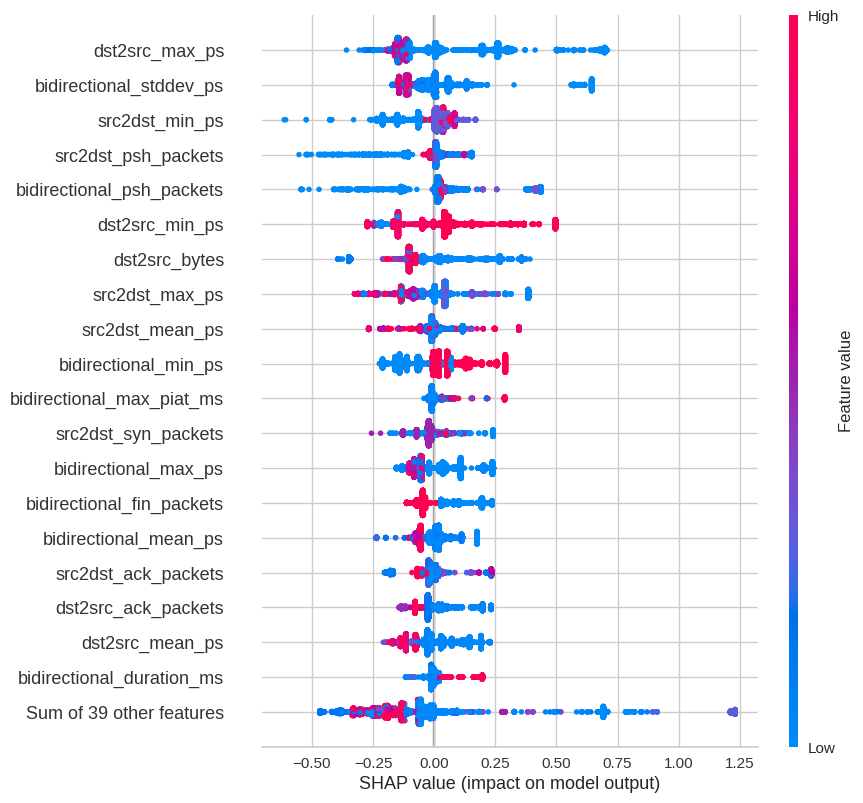

In [55]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

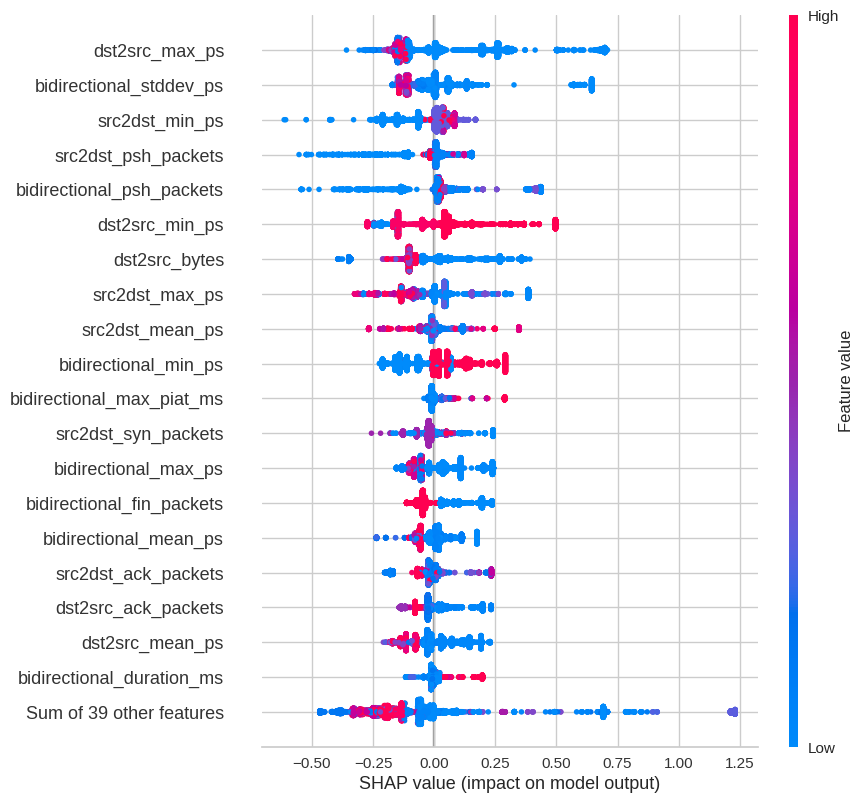

In [56]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

## FTP-Patator shap

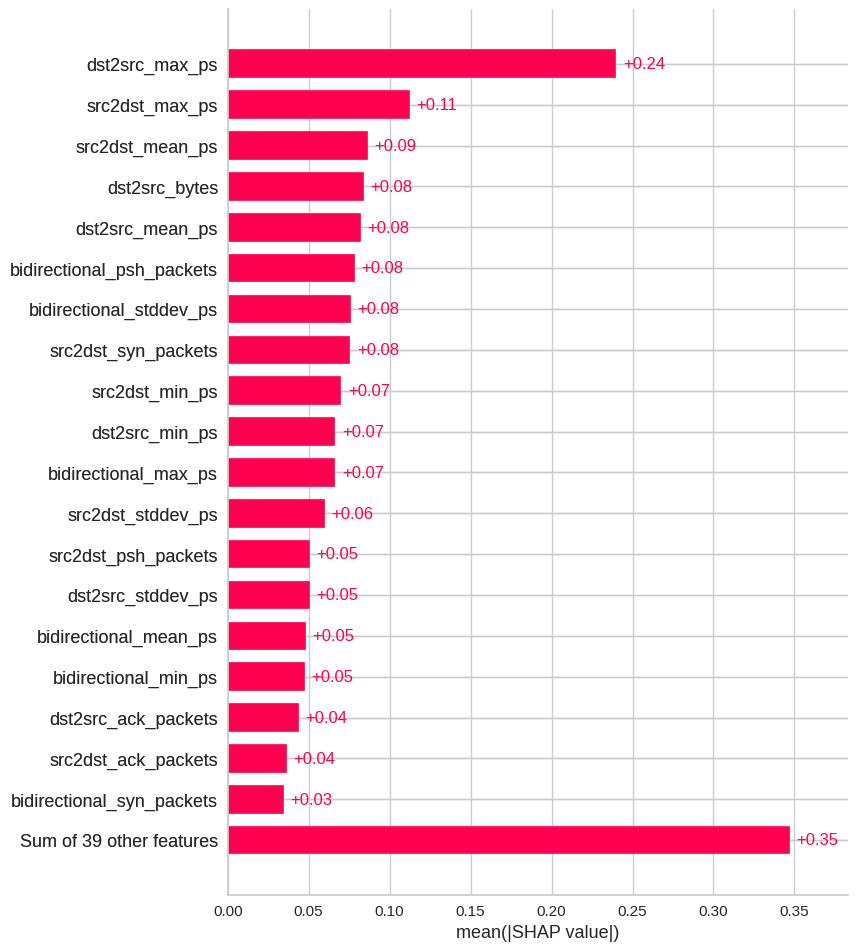

In [57]:
exp = Explanation(sv.values[:,:,7], 
                  sv.base_values[:,7], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

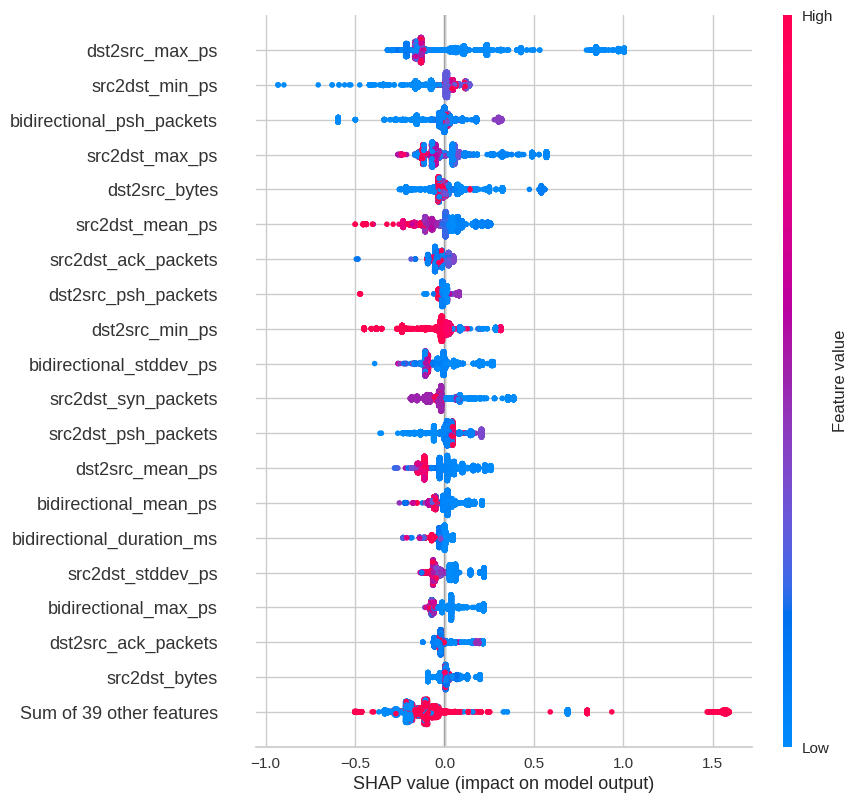

In [58]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

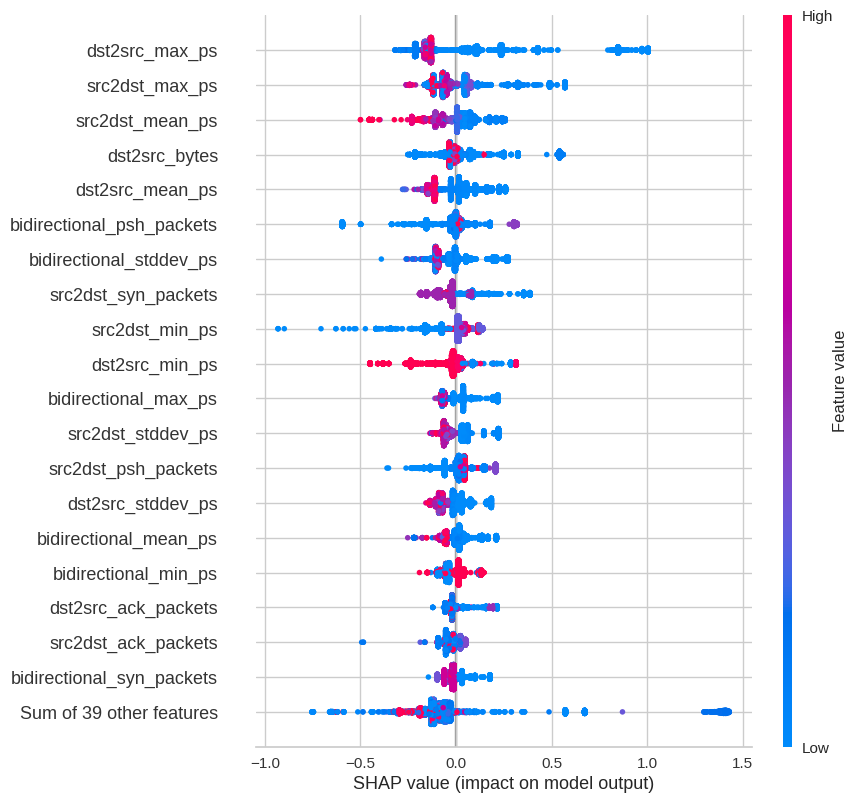

In [59]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Heartbleed shap

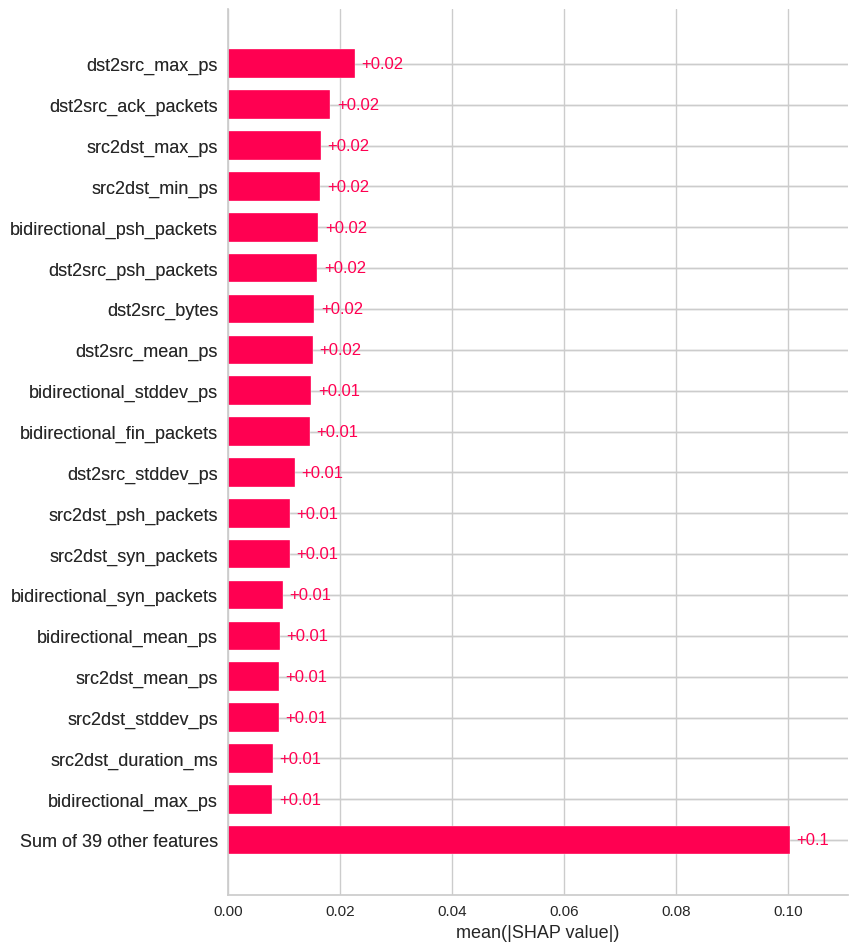

In [60]:
exp = Explanation(sv.values[:,:,8], 
                  sv.base_values[:,8], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

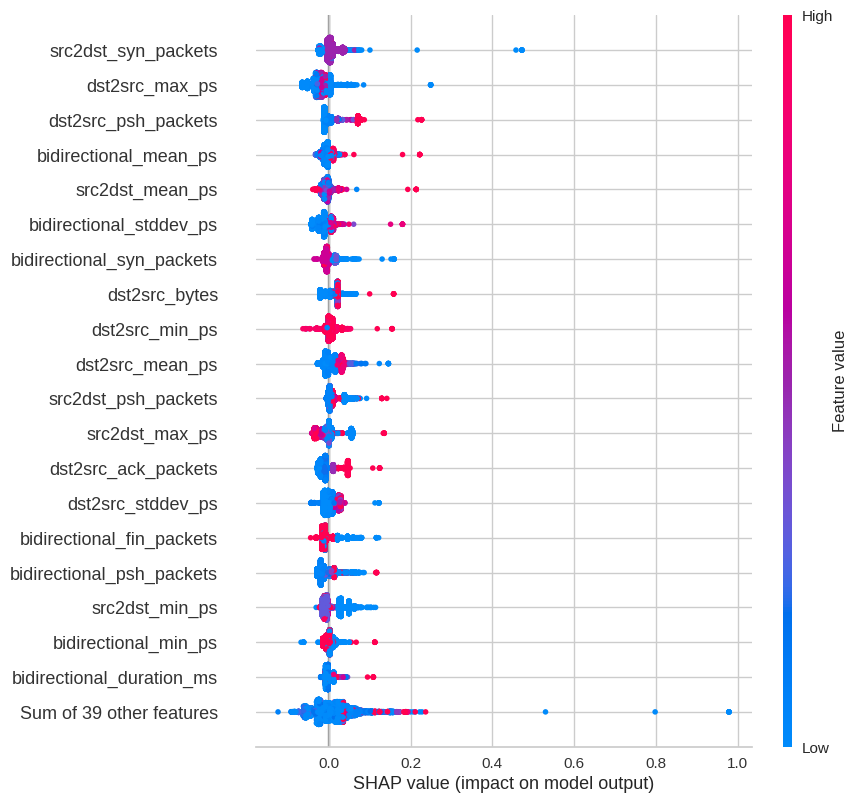

In [61]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

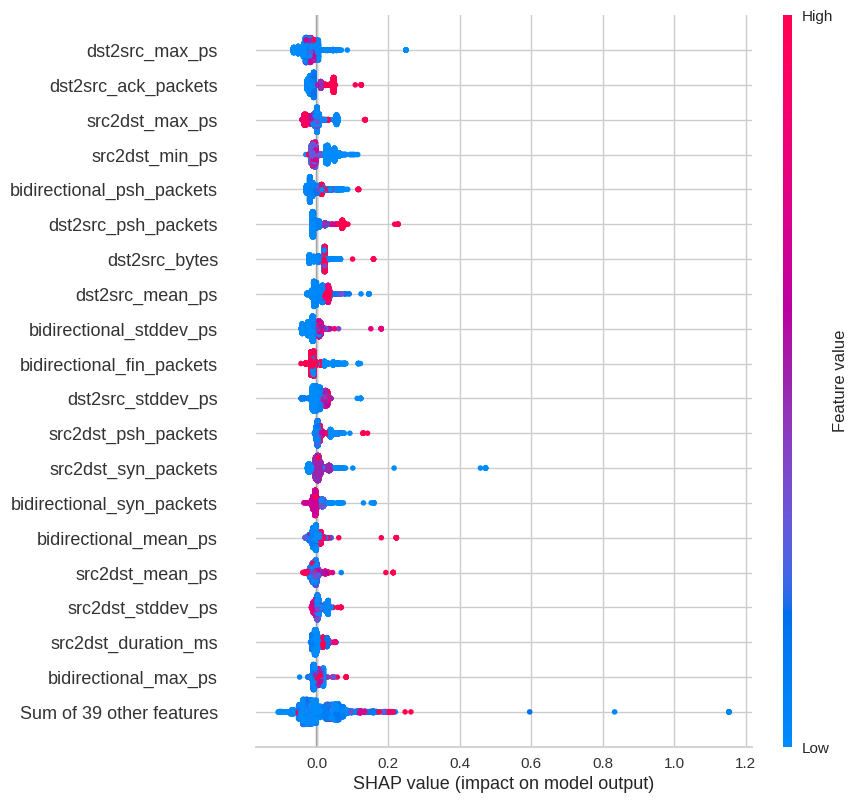

In [62]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Infiltration shap

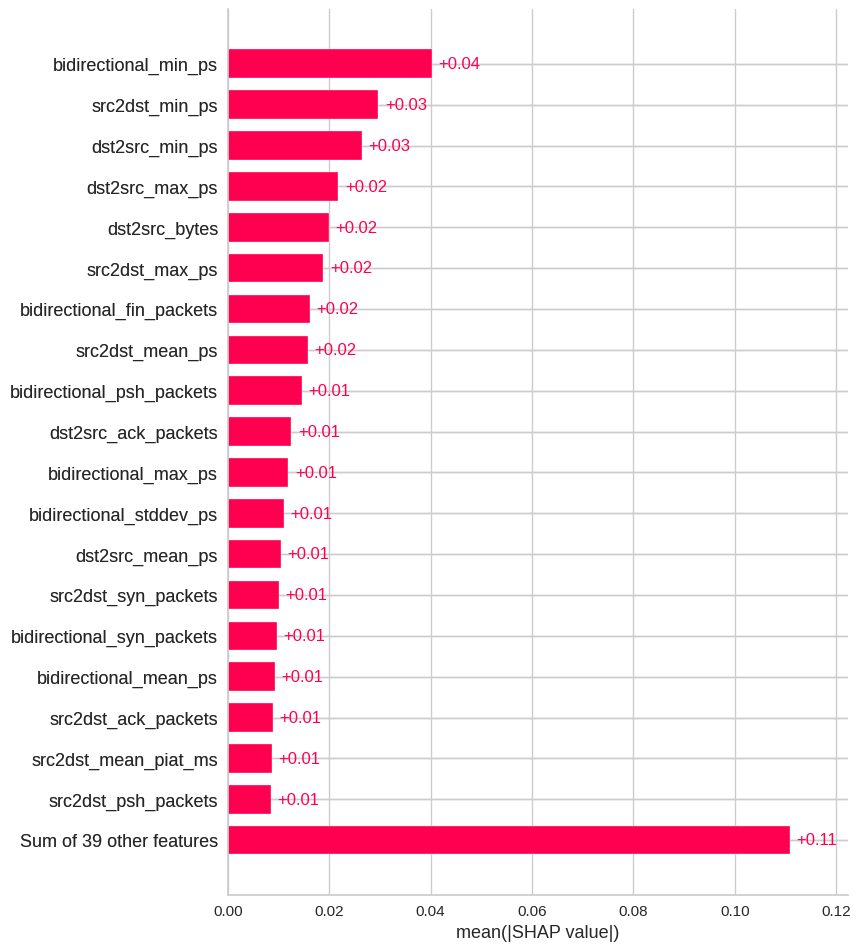

In [63]:
exp = Explanation(sv.values[:,:,9], 
                  sv.base_values[:,9], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

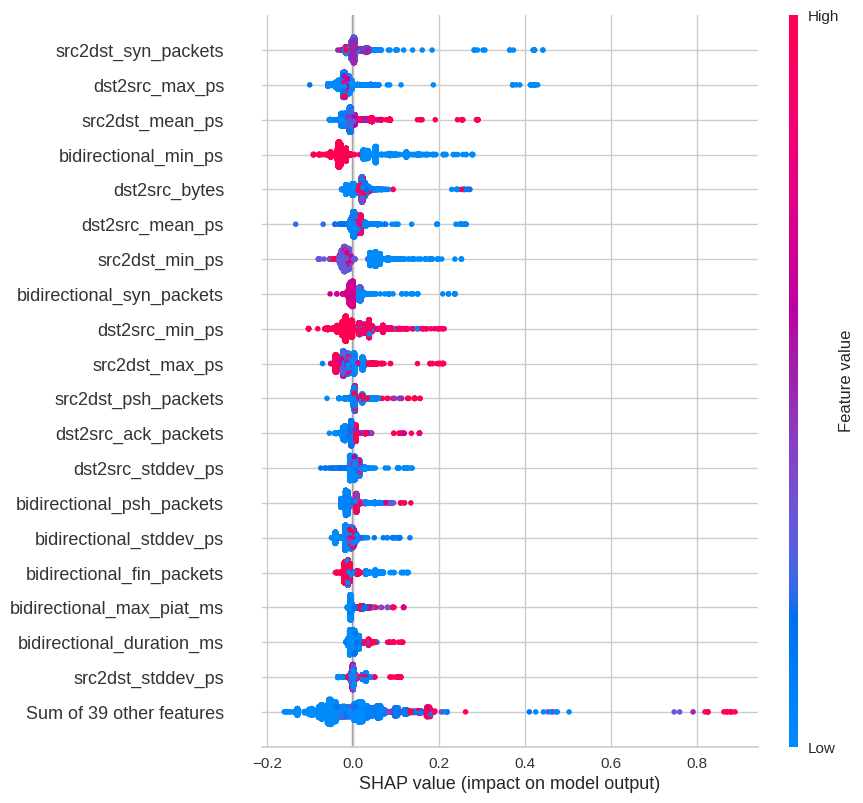

In [64]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

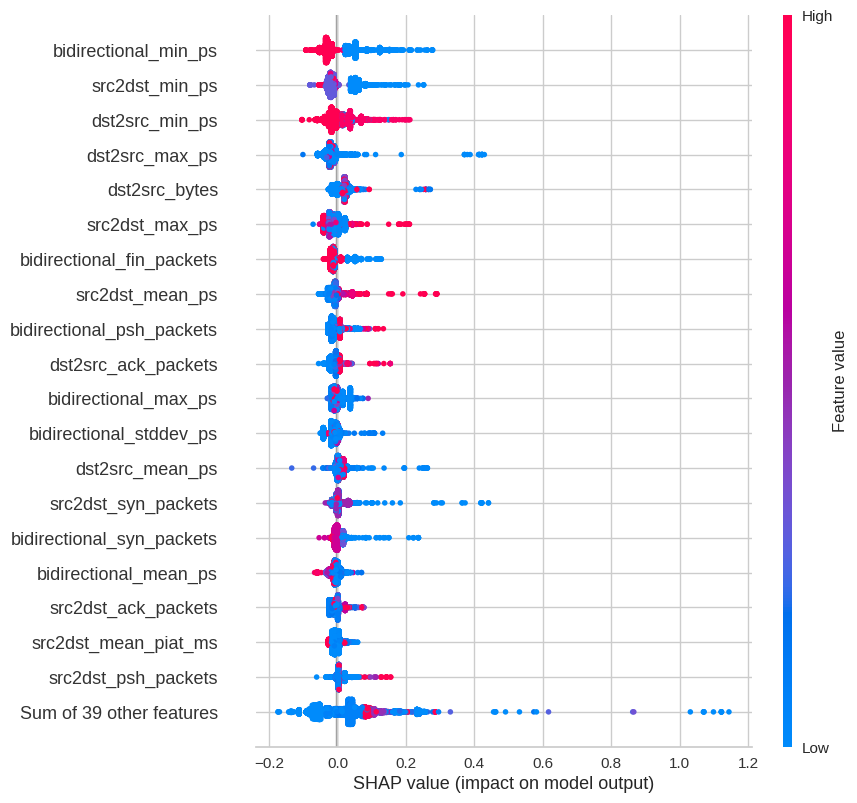

In [65]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## PortScan shap

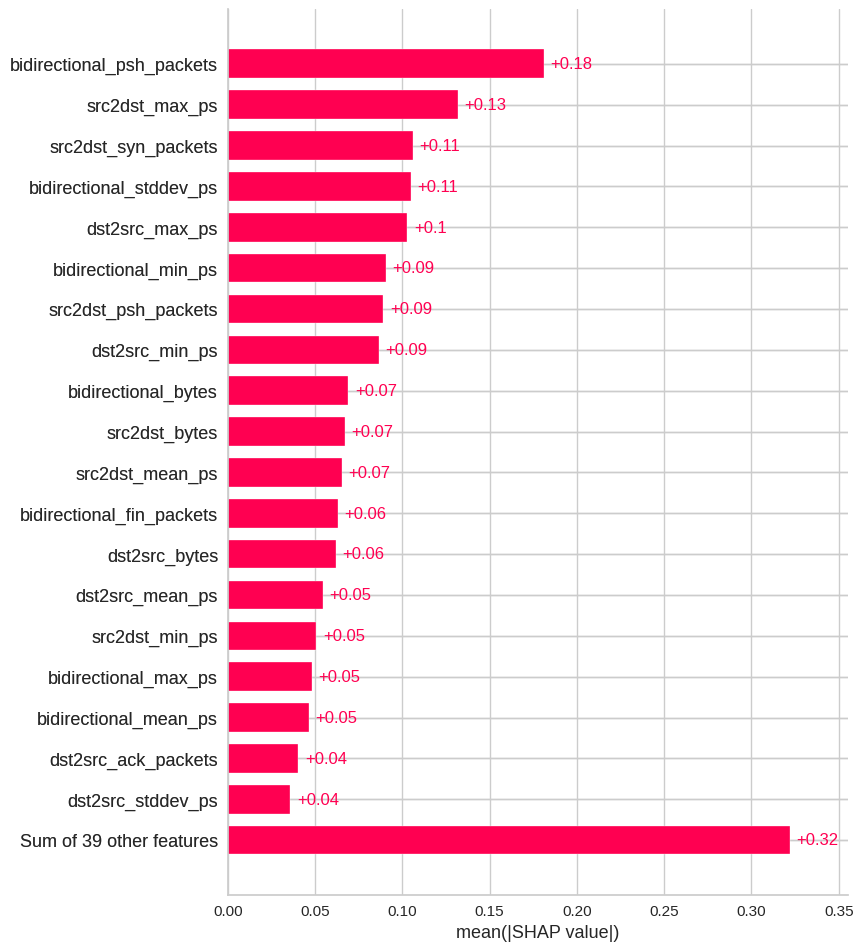

In [66]:
exp = Explanation(sv.values[:,:,10], 
                  sv.base_values[:,10], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

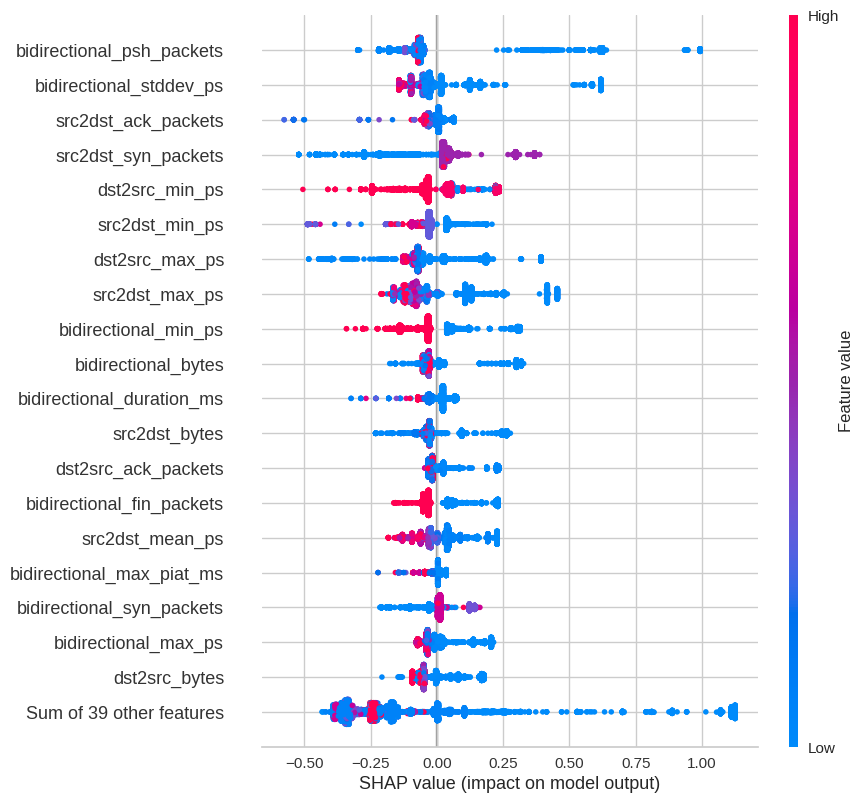

In [67]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

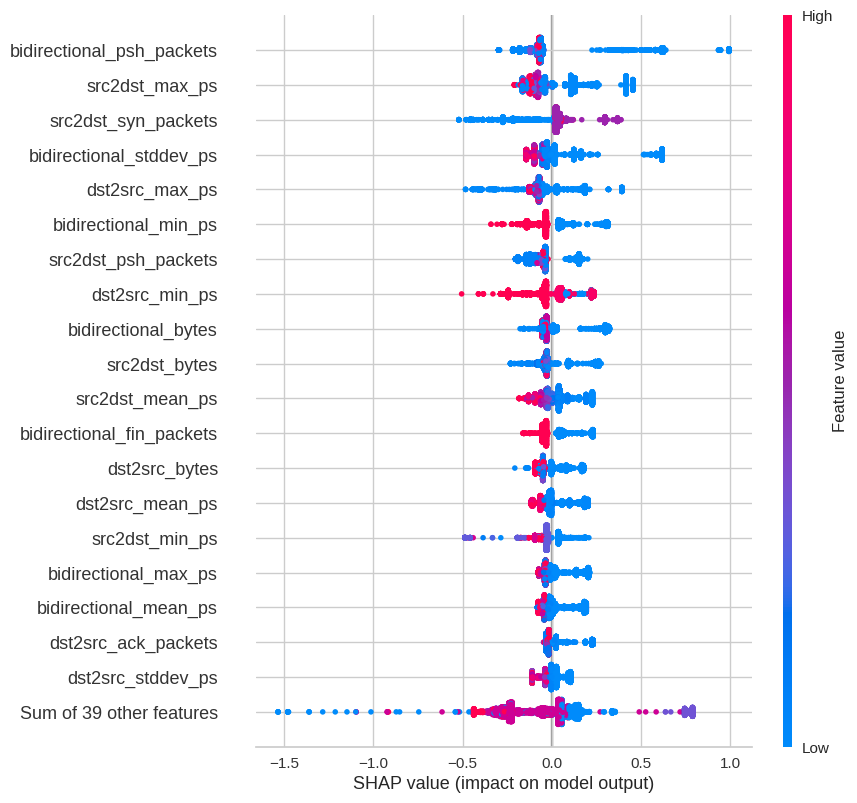

In [68]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## SSH-Patator shap

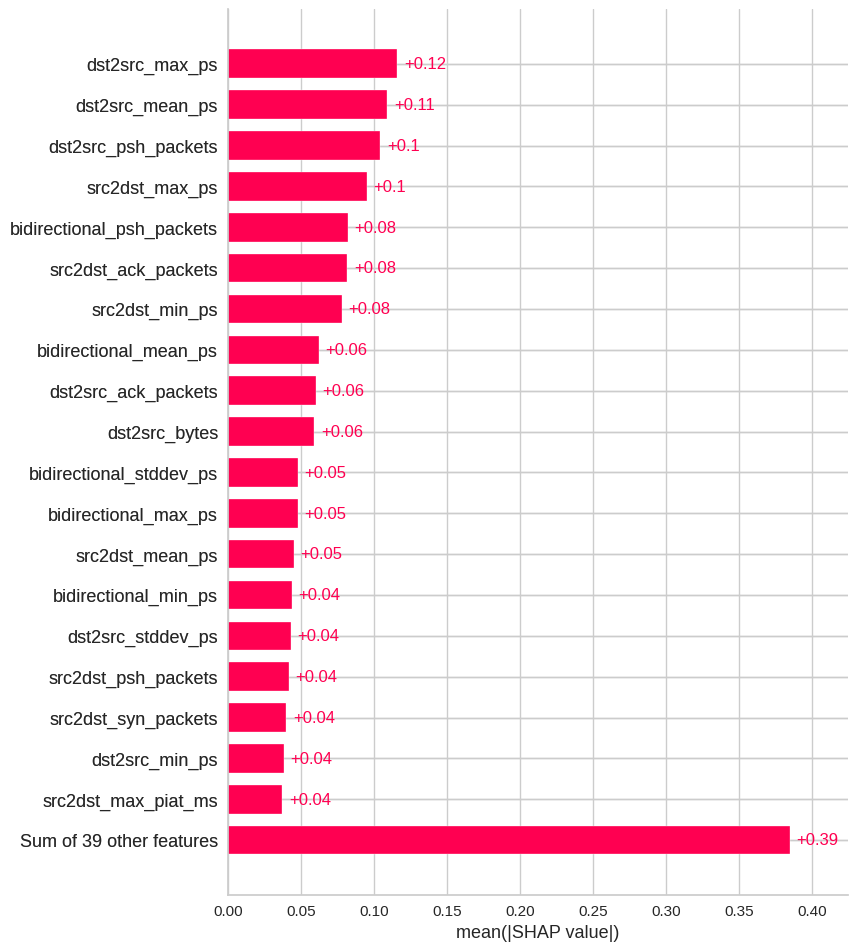

In [69]:
exp = Explanation(sv.values[:,:,11], 
                  sv.base_values[:,11], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

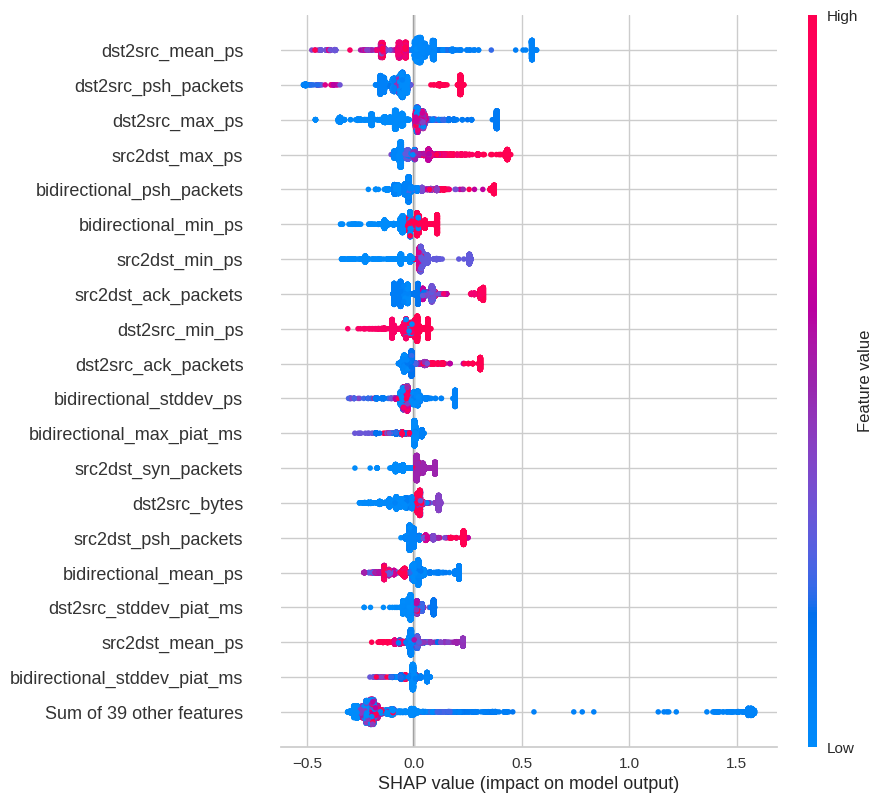

In [70]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

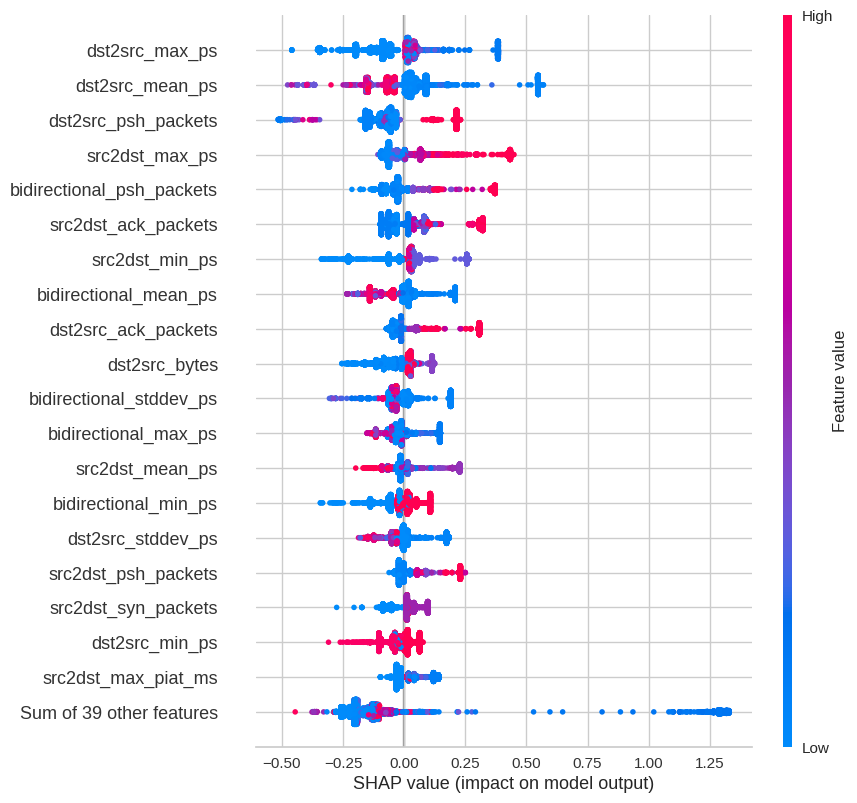

In [71]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Brute Force shap

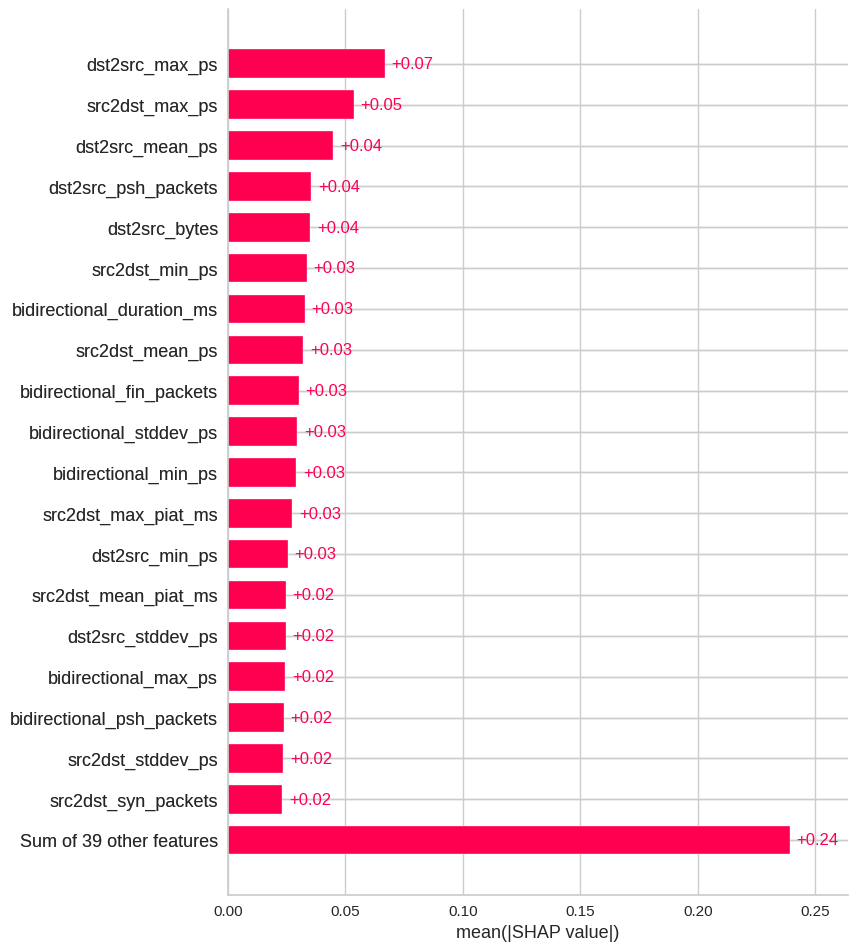

In [72]:
exp = Explanation(sv.values[:,:,12], 
                  sv.base_values[:,12], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

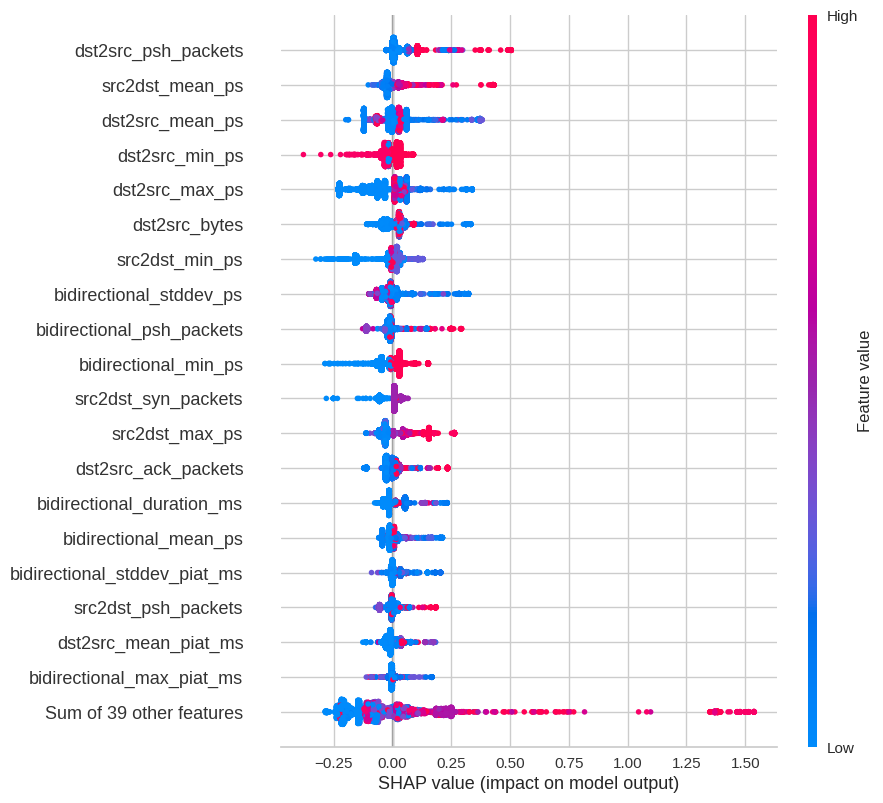

In [73]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

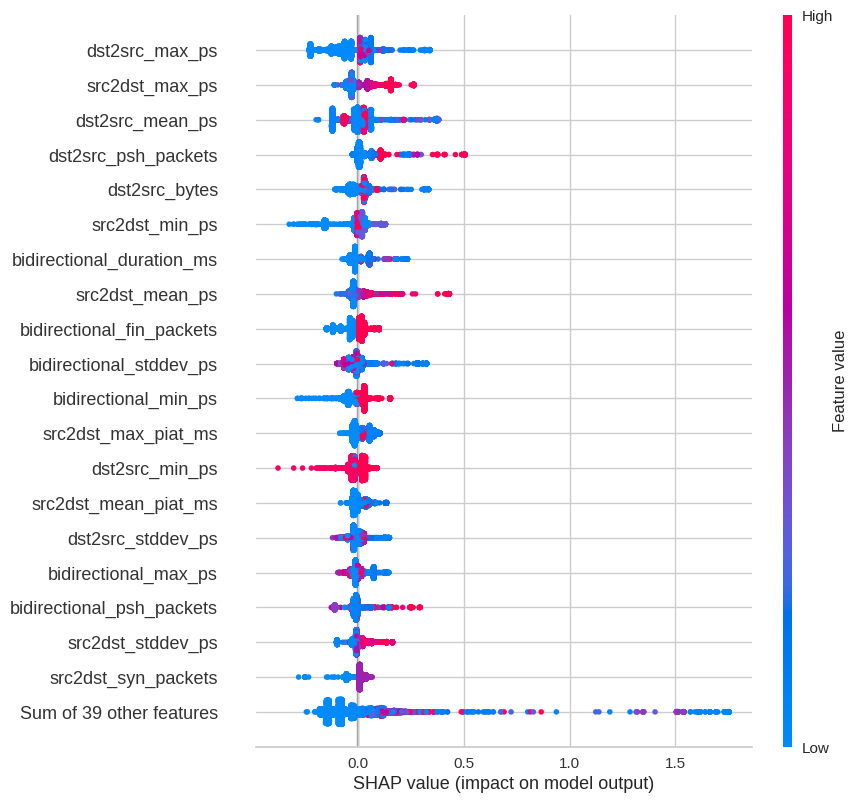

In [74]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Sql Injection shap

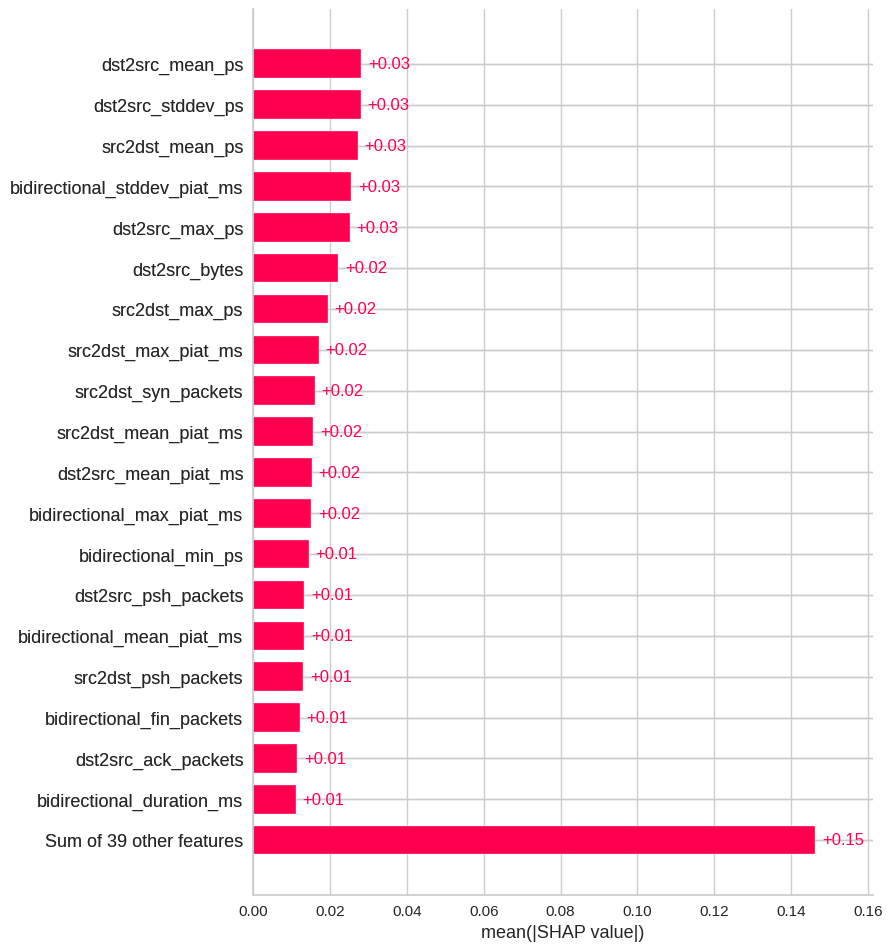

In [75]:
exp = Explanation(sv.values[:,:,13], 
                  sv.base_values[:,13], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

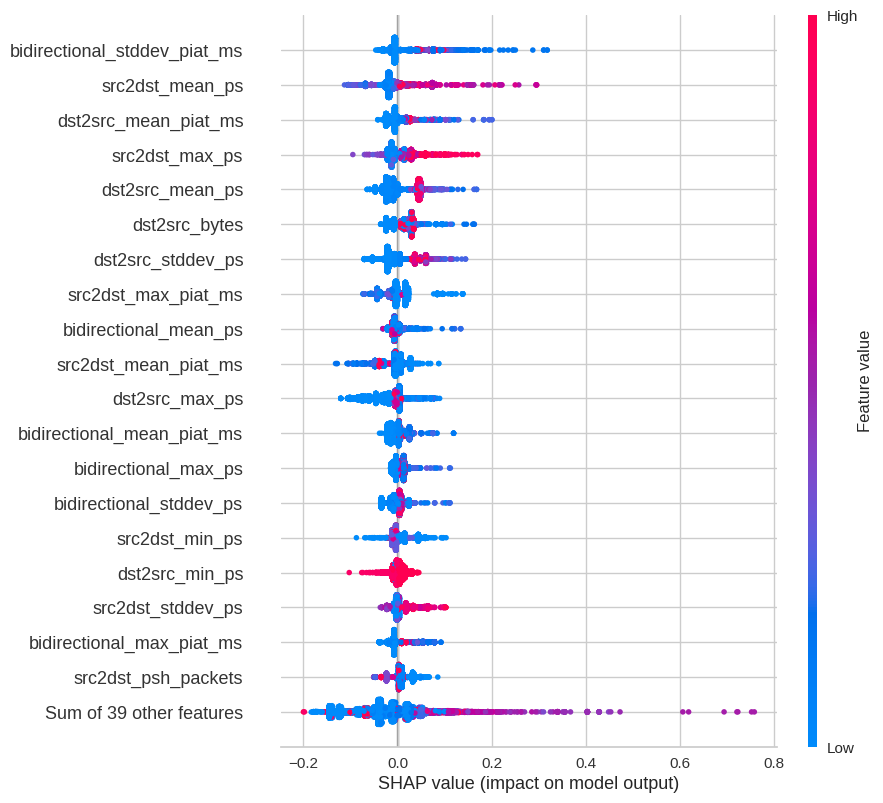

In [76]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

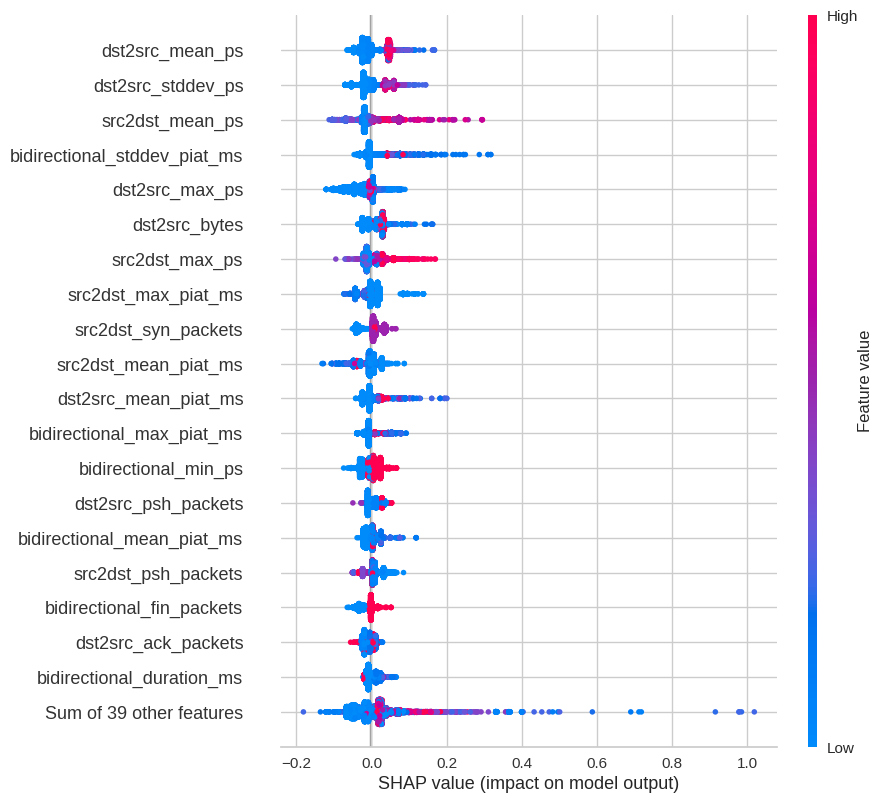

In [77]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - XSS shap

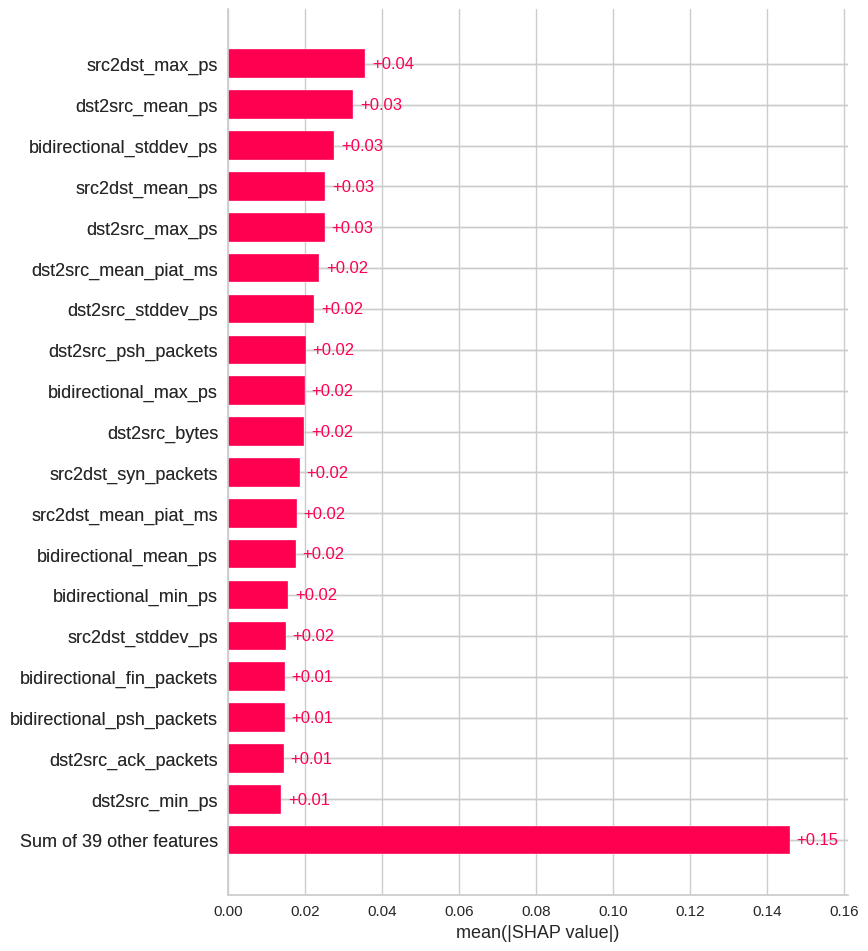

In [78]:
exp = Explanation(sv.values[:,:,14], 
                  sv.base_values[:,14], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

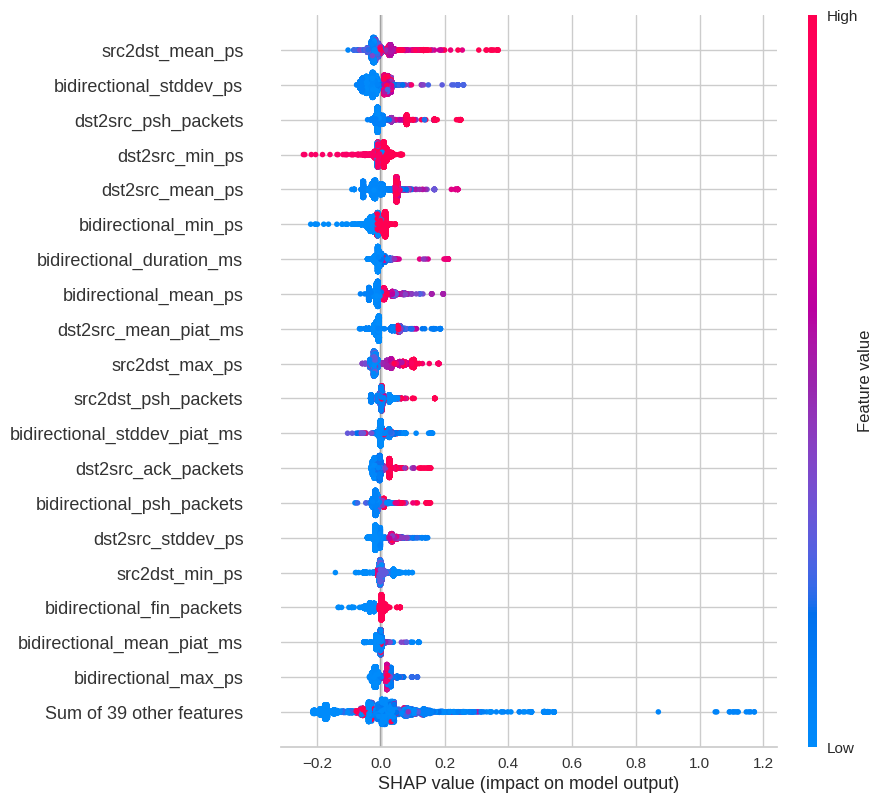

In [79]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

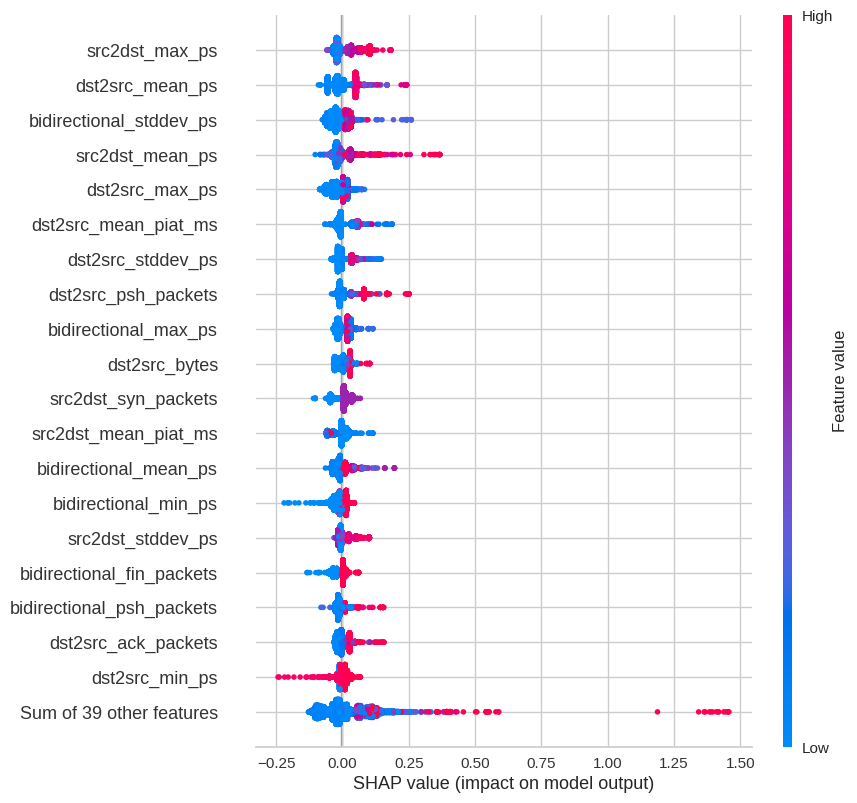

In [80]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Overall importance

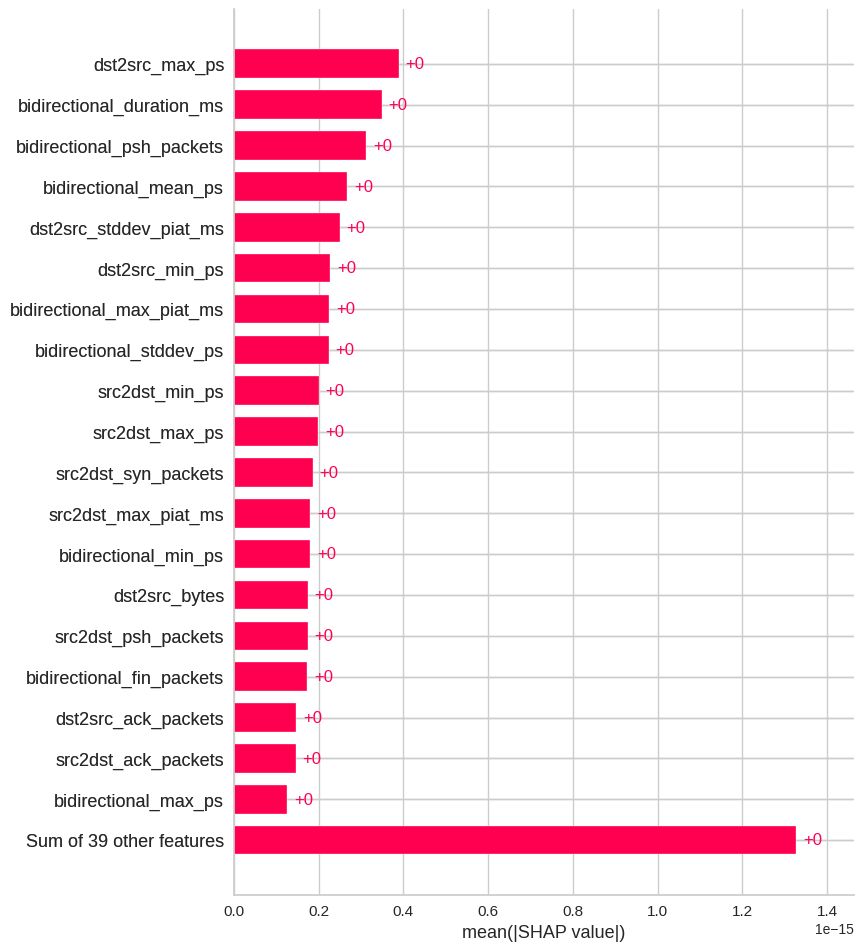

In [81]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

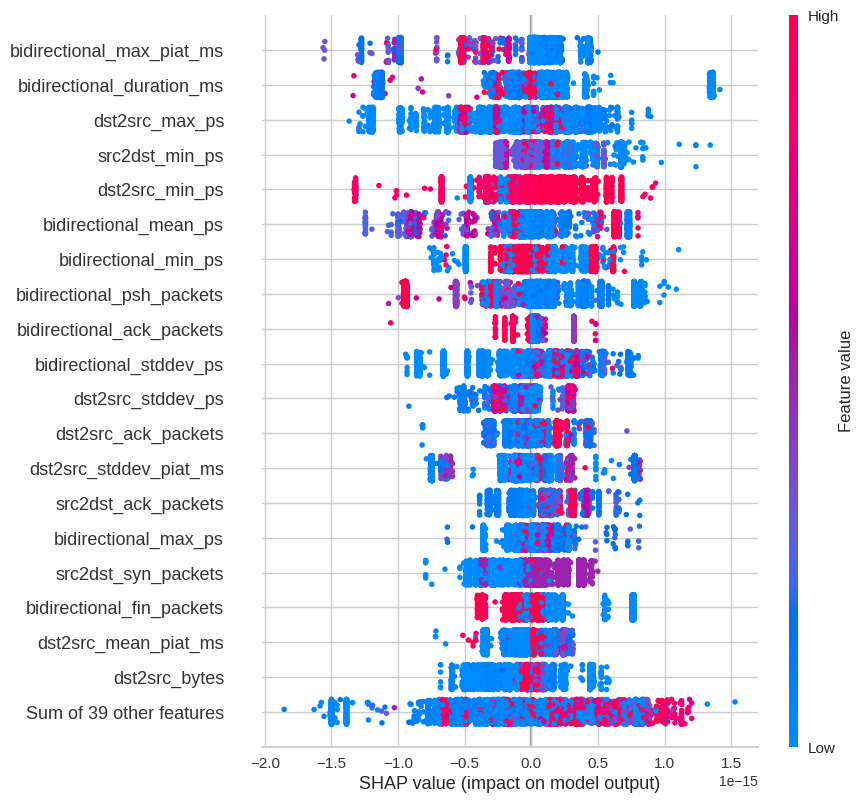

In [82]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

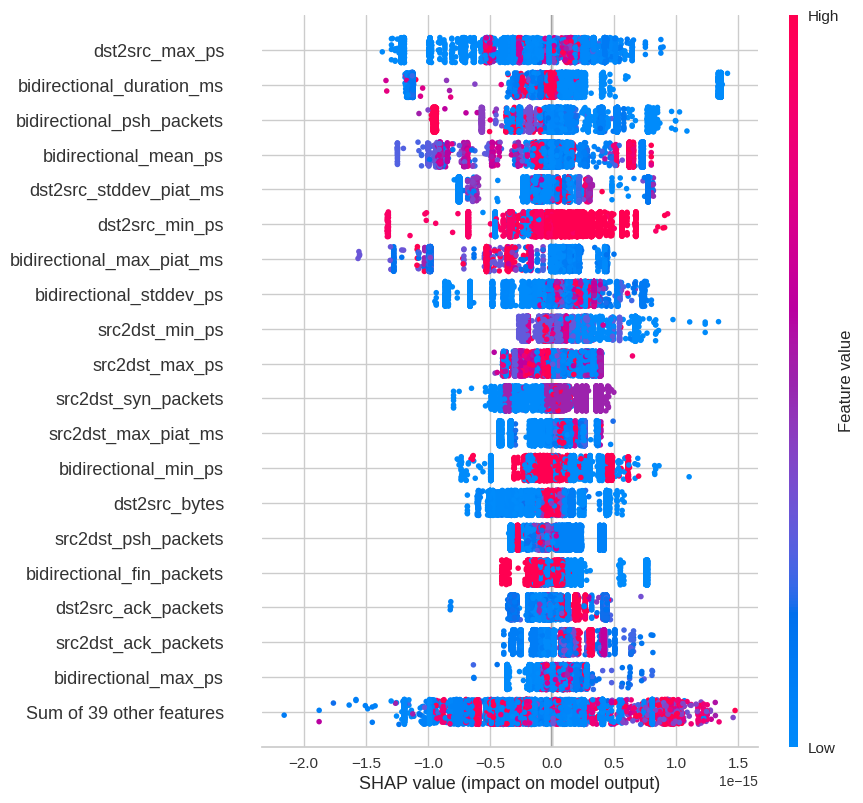

In [83]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [84]:
classes = sorted(pd.unique(ds['label']).tolist())

In [85]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7361869	total: 221ms	remaining: 8.62s
1:	learn: 1.4071234	total: 434ms	remaining: 8.24s
2:	learn: 1.1915436	total: 646ms	remaining: 7.96s
3:	learn: 1.0371189	total: 871ms	remaining: 7.84s
4:	learn: 0.9160854	total: 1.09s	remaining: 7.65s
5:	learn: 0.8095900	total: 1.33s	remaining: 7.55s
6:	learn: 0.7271732	total: 1.58s	remaining: 7.43s
7:	learn: 0.6568622	total: 1.82s	remaining: 7.27s
8:	learn: 0.5947149	total: 2.06s	remaining: 7.1s
9:	learn: 0.5415150	total: 2.3s	remaining: 6.9s
10:	learn: 0.4960775	total: 2.53s	remaining: 6.68s
11:	learn: 0.4560198	total: 2.78s	remaining: 6.49s
12:	learn: 0.4209367	total: 3.01s	remaining: 6.26s
13:	learn: 0.3898881	total: 3.26s	remaining: 6.05s
14:	learn: 0.3627989	total: 3.5s	remaining: 5.83s
15:	learn: 0.3383206	total: 3.74s	remaining: 5.61s
16:	learn: 0.3158150	total: 3.98s	remaining: 5.38s
17:	learn: 0.2945556	total: 4.22s	remaining: 5.16s
18:	learn: 0.2776270	total: 4.47s	remaining: 4.94s
19:	learn: 0.2607471	total: 4.71s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984901,0.886991
1,PRECISION,0.985164,0.837168
2,RECALL,0.984901,0.886991
3,F1 SCORE,0.984599,0.854353


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


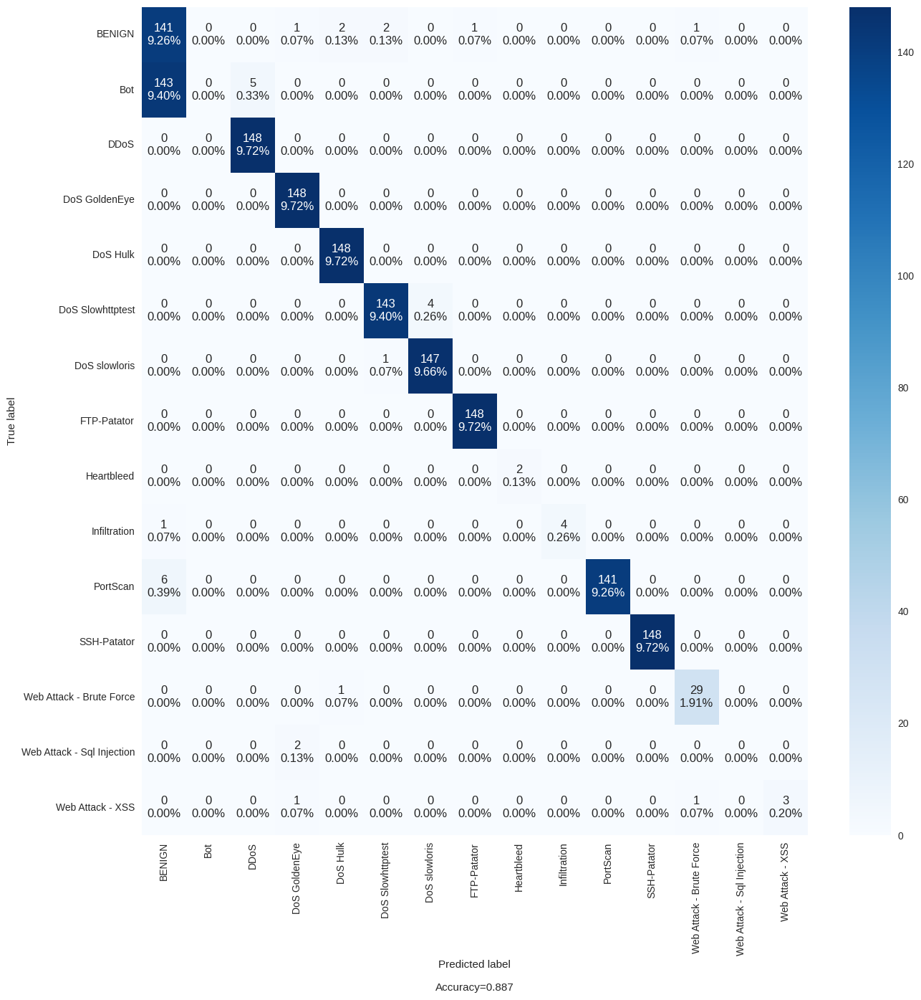

In [86]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [87]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7232926	total: 212ms	remaining: 8.29s
1:	learn: 1.4112961	total: 435ms	remaining: 8.27s
2:	learn: 1.2016359	total: 655ms	remaining: 8.08s
3:	learn: 1.0469067	total: 880ms	remaining: 7.92s
4:	learn: 0.9216986	total: 1.11s	remaining: 7.8s
5:	learn: 0.8145107	total: 1.35s	remaining: 7.66s
6:	learn: 0.7306053	total: 1.59s	remaining: 7.5s
7:	learn: 0.6553528	total: 1.83s	remaining: 7.34s
8:	learn: 0.5919534	total: 2.09s	remaining: 7.21s
9:	learn: 0.5397757	total: 2.34s	remaining: 7.03s
10:	learn: 0.4957595	total: 2.58s	remaining: 6.81s
11:	learn: 0.4571376	total: 2.85s	remaining: 6.66s
12:	learn: 0.4224526	total: 3.14s	remaining: 6.52s
13:	learn: 0.3909271	total: 3.43s	remaining: 6.37s
14:	learn: 0.3619580	total: 3.72s	remaining: 6.2s
15:	learn: 0.3376809	total: 4.01s	remaining: 6.02s
16:	learn: 0.3143052	total: 4.28s	remaining: 5.78s
17:	learn: 0.2927217	total: 4.53s	remaining: 5.54s
18:	learn: 0.2749431	total: 4.78s	remaining: 5.28s
19:	learn: 0.2602034	total: 5.05s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.982536,0.885020
1,PRECISION,0.982778,0.837776
2,RECALL,0.982536,0.885020
3,F1 SCORE,0.982256,0.853218


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


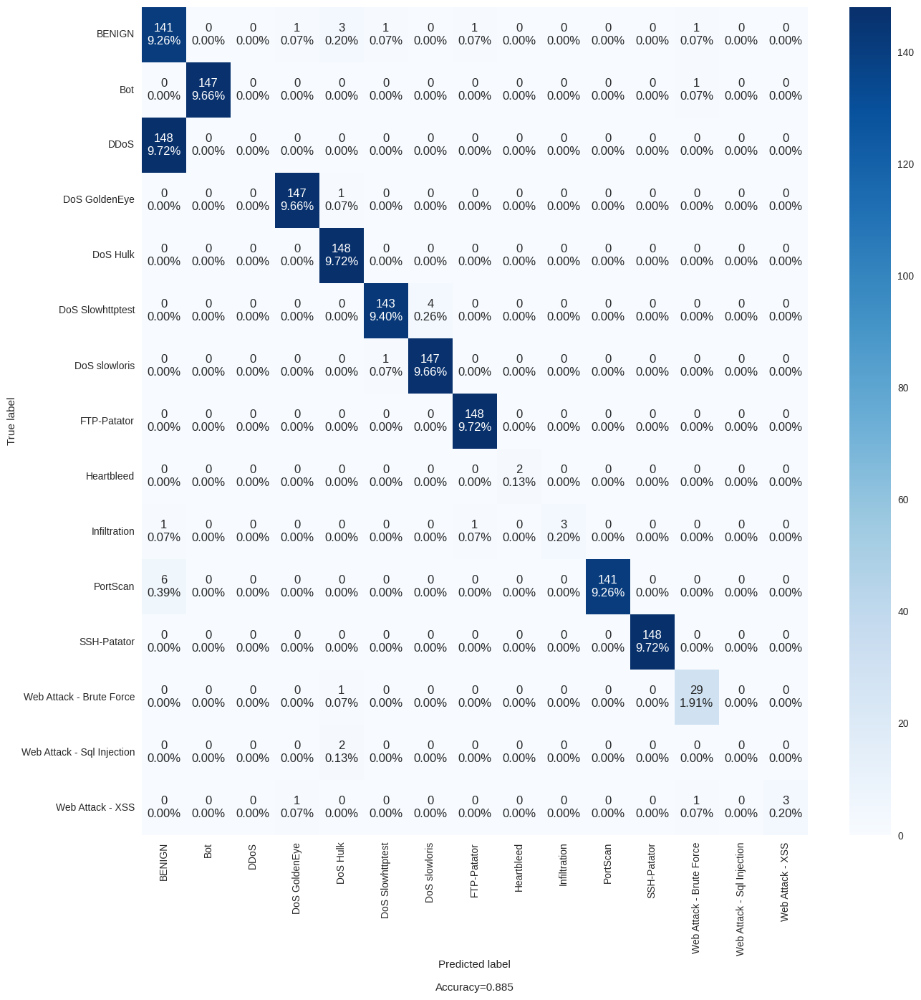

In [88]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [89]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.8365477	total: 227ms	remaining: 8.84s
1:	learn: 1.4586598	total: 456ms	remaining: 8.67s
2:	learn: 1.2303790	total: 679ms	remaining: 8.38s
3:	learn: 1.0594505	total: 916ms	remaining: 8.25s
4:	learn: 0.9203073	total: 1.17s	remaining: 8.19s
5:	learn: 0.8163503	total: 1.42s	remaining: 8.02s
6:	learn: 0.7306482	total: 1.68s	remaining: 7.9s
7:	learn: 0.6588765	total: 1.92s	remaining: 7.69s
8:	learn: 0.5955607	total: 2.17s	remaining: 7.46s
9:	learn: 0.5427295	total: 2.41s	remaining: 7.24s
10:	learn: 0.4934731	total: 2.65s	remaining: 6.98s
11:	learn: 0.4513588	total: 2.89s	remaining: 6.74s
12:	learn: 0.4155171	total: 3.13s	remaining: 6.51s
13:	learn: 0.3838817	total: 3.38s	remaining: 6.28s
14:	learn: 0.3545718	total: 3.66s	remaining: 6.1s
15:	learn: 0.3286600	total: 3.93s	remaining: 5.9s
16:	learn: 0.3047350	total: 4.21s	remaining: 5.69s
17:	learn: 0.2838310	total: 4.49s	remaining: 5.48s
18:	learn: 0.2656223	total: 4.82s	remaining: 5.33s
19:	learn: 0.2498041	total: 5.09s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.986356,0.886991
1,PRECISION,0.986560,0.830498
2,RECALL,0.986356,0.886991
3,F1 SCORE,0.986261,0.852177


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


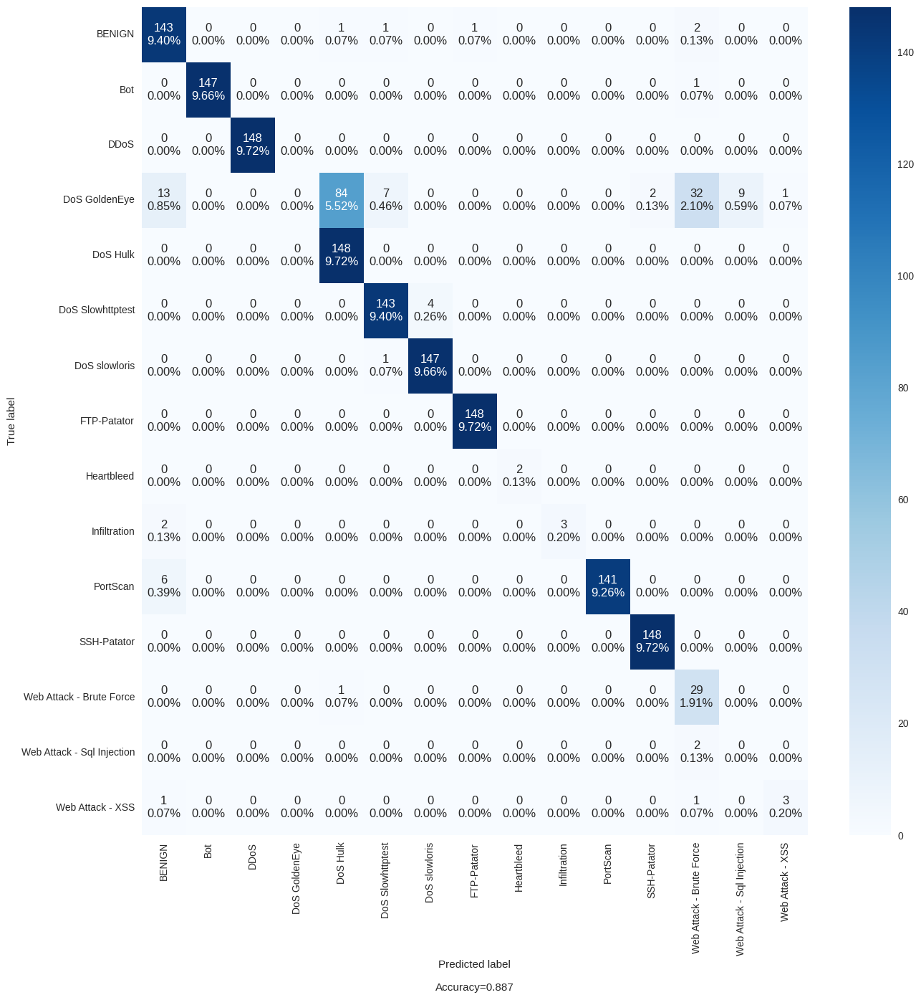

In [90]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [91]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.8321577	total: 403ms	remaining: 15.7s
1:	learn: 1.4673980	total: 823ms	remaining: 15.6s
2:	learn: 1.2250199	total: 1.21s	remaining: 14.9s
3:	learn: 1.0597869	total: 1.56s	remaining: 14s
4:	learn: 0.9213700	total: 1.89s	remaining: 13.2s
5:	learn: 0.8154234	total: 2.23s	remaining: 12.6s
6:	learn: 0.7286713	total: 2.57s	remaining: 12.1s
7:	learn: 0.6556668	total: 2.91s	remaining: 11.6s
8:	learn: 0.5949883	total: 3.25s	remaining: 11.2s
9:	learn: 0.5431309	total: 3.6s	remaining: 10.8s
10:	learn: 0.4954696	total: 3.92s	remaining: 10.3s
11:	learn: 0.4568984	total: 4.25s	remaining: 9.91s
12:	learn: 0.4190732	total: 4.62s	remaining: 9.59s
13:	learn: 0.3873086	total: 4.95s	remaining: 9.2s
14:	learn: 0.3565626	total: 5.28s	remaining: 8.79s
15:	learn: 0.3312051	total: 5.61s	remaining: 8.41s
16:	learn: 0.3087369	total: 5.94s	remaining: 8.03s
17:	learn: 0.2869005	total: 6.3s	remaining: 7.71s
18:	learn: 0.2693387	total: 6.64s	remaining: 7.33s
19:	learn: 0.2530942	total: 6.97s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.983446,0.886991
1,PRECISION,0.983687,0.837745
2,RECALL,0.983446,0.886991
3,F1 SCORE,0.982992,0.854089


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


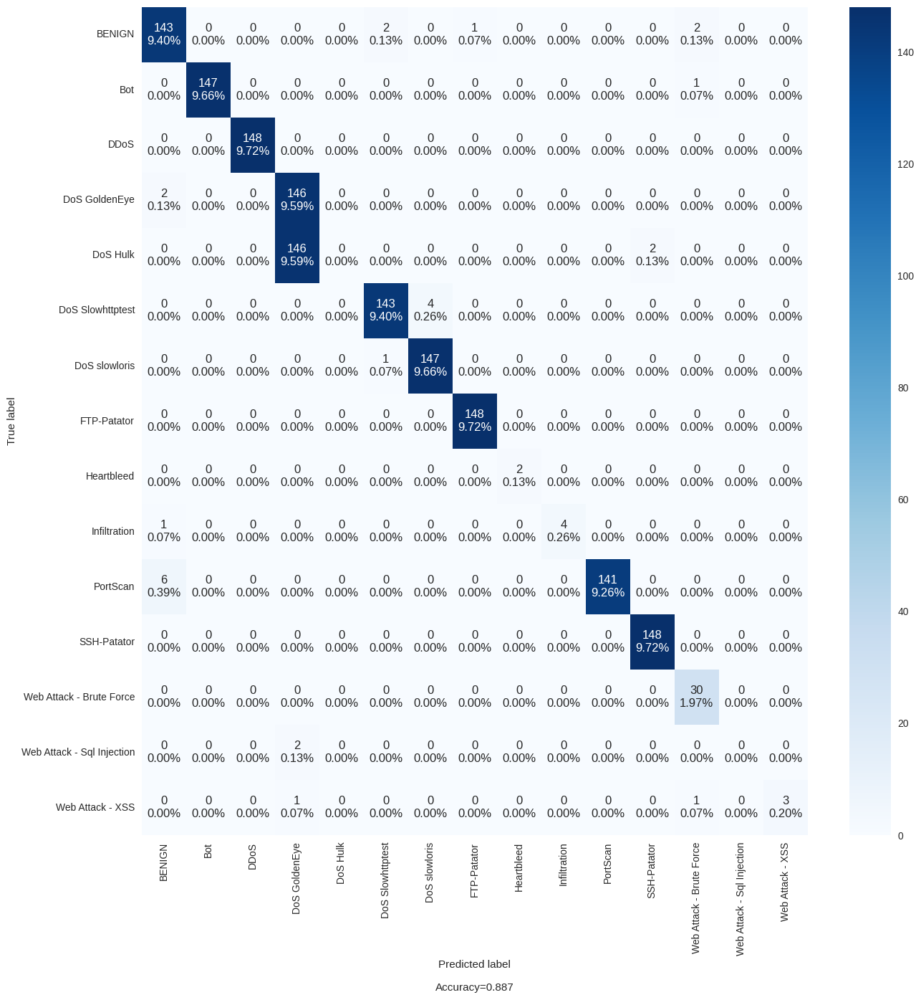

In [92]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [93]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7405154	total: 583ms	remaining: 22.7s
1:	learn: 1.3838599	total: 948ms	remaining: 18s
2:	learn: 1.1522716	total: 1.28s	remaining: 15.9s
3:	learn: 0.9865471	total: 1.63s	remaining: 14.7s
4:	learn: 0.8565585	total: 1.96s	remaining: 13.7s
5:	learn: 0.7518804	total: 2.3s	remaining: 13s
6:	learn: 0.6682316	total: 2.66s	remaining: 12.5s
7:	learn: 0.5976433	total: 3s	remaining: 12s
8:	learn: 0.5392256	total: 3.31s	remaining: 11.4s
9:	learn: 0.4856260	total: 3.62s	remaining: 10.9s
10:	learn: 0.4417631	total: 3.98s	remaining: 10.5s
11:	learn: 0.4028695	total: 4.32s	remaining: 10.1s
12:	learn: 0.3684118	total: 4.71s	remaining: 9.79s
13:	learn: 0.3378931	total: 5.09s	remaining: 9.45s
14:	learn: 0.3098638	total: 5.42s	remaining: 9.04s
15:	learn: 0.2862992	total: 5.79s	remaining: 8.68s
16:	learn: 0.2651965	total: 6.2s	remaining: 8.39s
17:	learn: 0.2456127	total: 6.7s	remaining: 8.19s
18:	learn: 0.2289188	total: 7.06s	remaining: 7.8s
19:	learn: 0.2138665	total: 7.39s	remaining: 7.39s
20:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990175,0.888305
1,PRECISION,0.990338,0.838832
2,RECALL,0.990175,0.888305
3,F1 SCORE,0.989832,0.855081


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


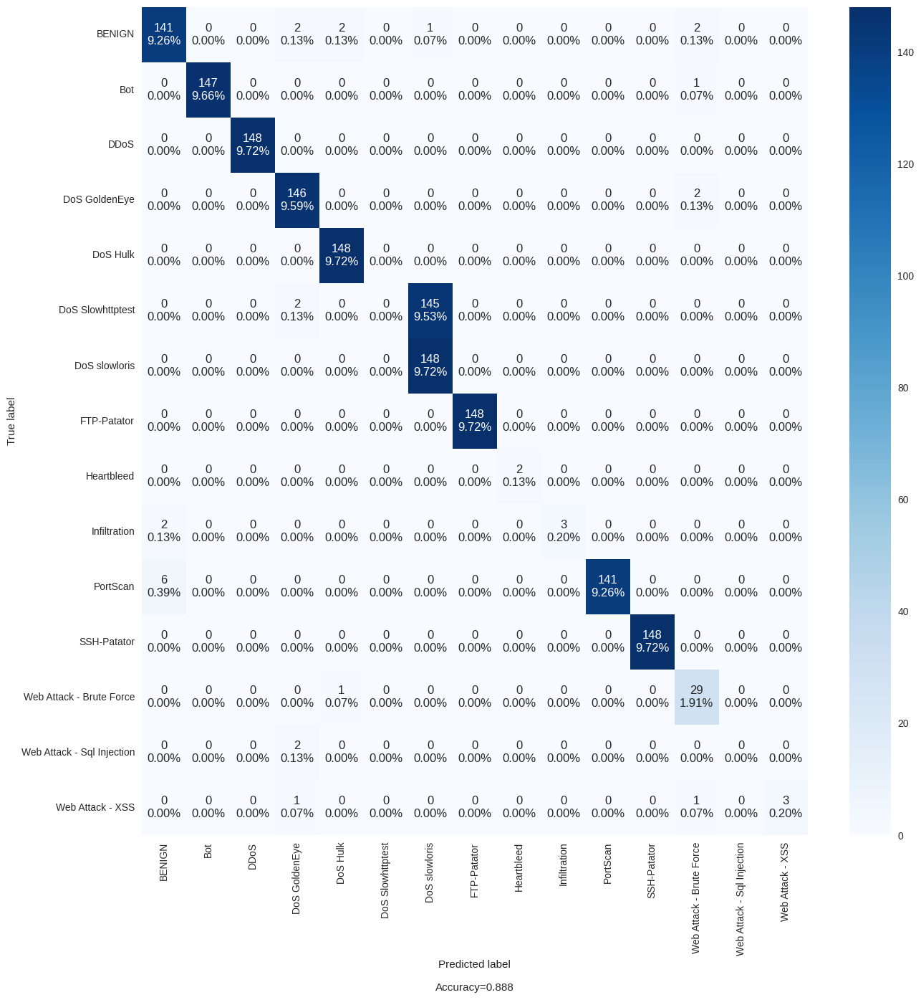

In [94]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [95]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7149099	total: 478ms	remaining: 18.6s


1:	learn: 1.3929491	total: 835ms	remaining: 15.9s
2:	learn: 1.1753648	total: 1.15s	remaining: 14.2s
3:	learn: 1.0153325	total: 1.48s	remaining: 13.3s
4:	learn: 0.8811824	total: 1.79s	remaining: 12.5s
5:	learn: 0.7783093	total: 2.1s	remaining: 11.9s
6:	learn: 0.6917278	total: 2.41s	remaining: 11.3s
7:	learn: 0.6182310	total: 2.76s	remaining: 11s
8:	learn: 0.5570809	total: 3.12s	remaining: 10.7s
9:	learn: 0.5048485	total: 3.45s	remaining: 10.3s
10:	learn: 0.4583747	total: 3.78s	remaining: 9.97s
11:	learn: 0.4183782	total: 4.12s	remaining: 9.61s
12:	learn: 0.3823172	total: 4.44s	remaining: 9.22s
13:	learn: 0.3518447	total: 4.74s	remaining: 8.8s
14:	learn: 0.3244240	total: 5.07s	remaining: 8.44s
15:	learn: 0.2999686	total: 5.38s	remaining: 8.07s
16:	learn: 0.2787583	total: 5.72s	remaining: 7.74s
17:	learn: 0.2581506	total: 6.05s	remaining: 7.39s
18:	learn: 0.2417313	total: 6.4s	remaining: 7.07s
19:	learn: 0.2245951	total: 6.72s	remaining: 6.72s
20:	learn: 0.2103225	total: 7.06s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.987630,0.888962
1,PRECISION,0.987717,0.840187
2,RECALL,0.987630,0.888962
3,F1 SCORE,0.987376,0.856071


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


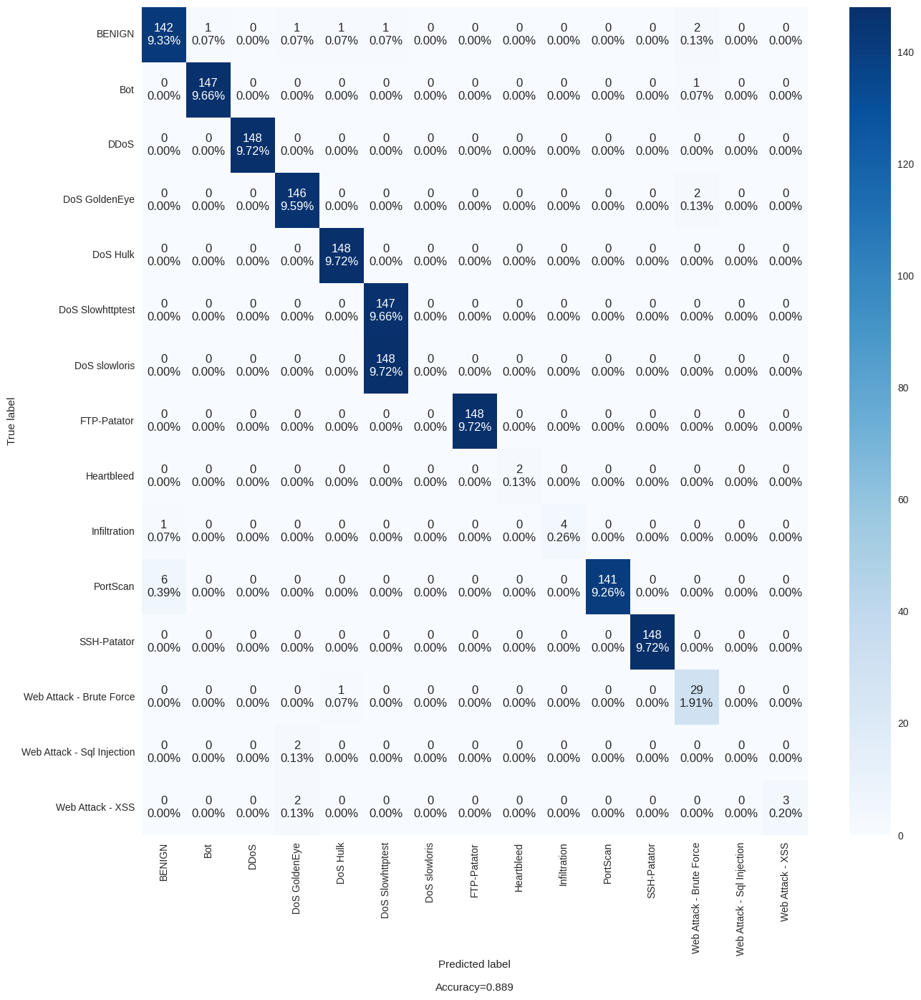

In [96]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [97]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7602732	total: 468ms	remaining: 18.2s
1:	learn: 1.4332006	total: 841ms	remaining: 16s
2:	learn: 1.2086534	total: 1.16s	remaining: 14.3s
3:	learn: 1.0521984	total: 1.47s	remaining: 13.3s
4:	learn: 0.9181253	total: 1.78s	remaining: 12.5s
5:	learn: 0.8086942	total: 2.09s	remaining: 11.9s
6:	learn: 0.7234591	total: 2.4s	remaining: 11.3s
7:	learn: 0.6523155	total: 2.7s	remaining: 10.8s
8:	learn: 0.5933665	total: 3s	remaining: 10.3s
9:	learn: 0.5403358	total: 3.31s	remaining: 9.92s
10:	learn: 0.4917532	total: 3.61s	remaining: 9.52s
11:	learn: 0.4500195	total: 3.96s	remaining: 9.23s
12:	learn: 0.4150405	total: 4.28s	remaining: 8.88s
13:	learn: 0.3846796	total: 4.57s	remaining: 8.48s
14:	learn: 0.3561422	total: 4.88s	remaining: 8.13s
15:	learn: 0.3312582	total: 5.2s	remaining: 7.8s
16:	learn: 0.3093107	total: 5.55s	remaining: 7.51s
17:	learn: 0.2894978	total: 5.88s	remaining: 7.18s
18:	learn: 0.2717149	total: 6.2s	remaining: 6.85s
19:	learn: 0.2544301	total: 6.54s	remaining: 6.54s


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984901,0.886991
1,PRECISION,0.985260,0.821850
2,RECALL,0.984901,0.886991
3,F1 SCORE,0.984176,0.847869


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


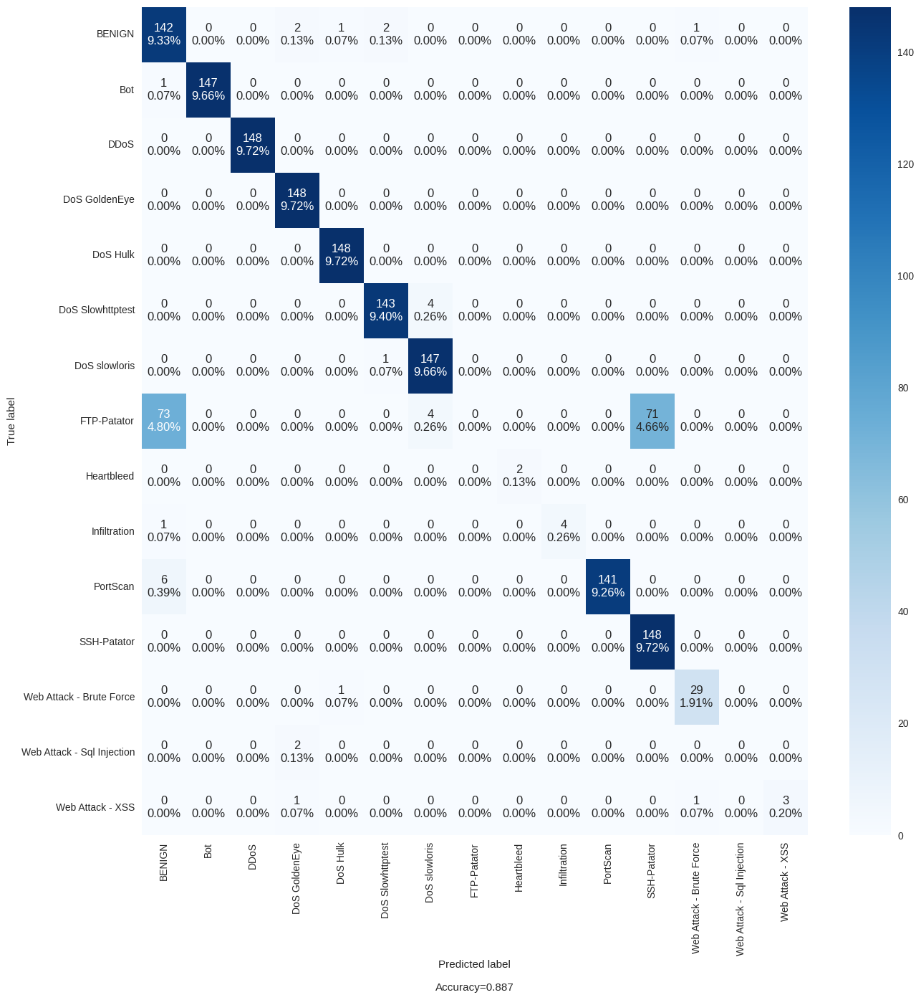

In [98]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [99]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7772109	total: 500ms	remaining: 19.5s
1:	learn: 1.4109470	total: 849ms	remaining: 16.1s
2:	learn: 1.1856121	total: 1.25s	remaining: 15.5s
3:	learn: 1.0302220	total: 1.59s	remaining: 14.4s
4:	learn: 0.9028573	total: 1.93s	remaining: 13.5s
5:	learn: 0.8007565	total: 2.28s	remaining: 12.9s
6:	learn: 0.7181905	total: 2.61s	remaining: 12.3s
7:	learn: 0.6468646	total: 2.92s	remaining: 11.7s
8:	learn: 0.5890885	total: 3.24s	remaining: 11.2s
9:	learn: 0.5347099	total: 3.56s	remaining: 10.7s
10:	learn: 0.4872161	total: 3.93s	remaining: 10.4s
11:	learn: 0.4457623	total: 4.25s	remaining: 9.92s
12:	learn: 0.4108695	total: 4.57s	remaining: 9.48s
13:	learn: 0.3800209	total: 4.92s	remaining: 9.13s
14:	learn: 0.3500864	total: 5.24s	remaining: 8.73s
15:	learn: 0.3251556	total: 5.56s	remaining: 8.34s
16:	learn: 0.3017807	total: 5.88s	remaining: 7.96s
17:	learn: 0.2807872	total: 6.2s	remaining: 7.58s
18:	learn: 0.2611651	total: 6.55s	remaining: 7.24s
19:	learn: 0.2446768	total: 6.87s	remainin

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.985851,0.981603
1,PRECISION,0.986088,0.979442
2,RECALL,0.985851,0.981603
3,F1 SCORE,0.985305,0.980078


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


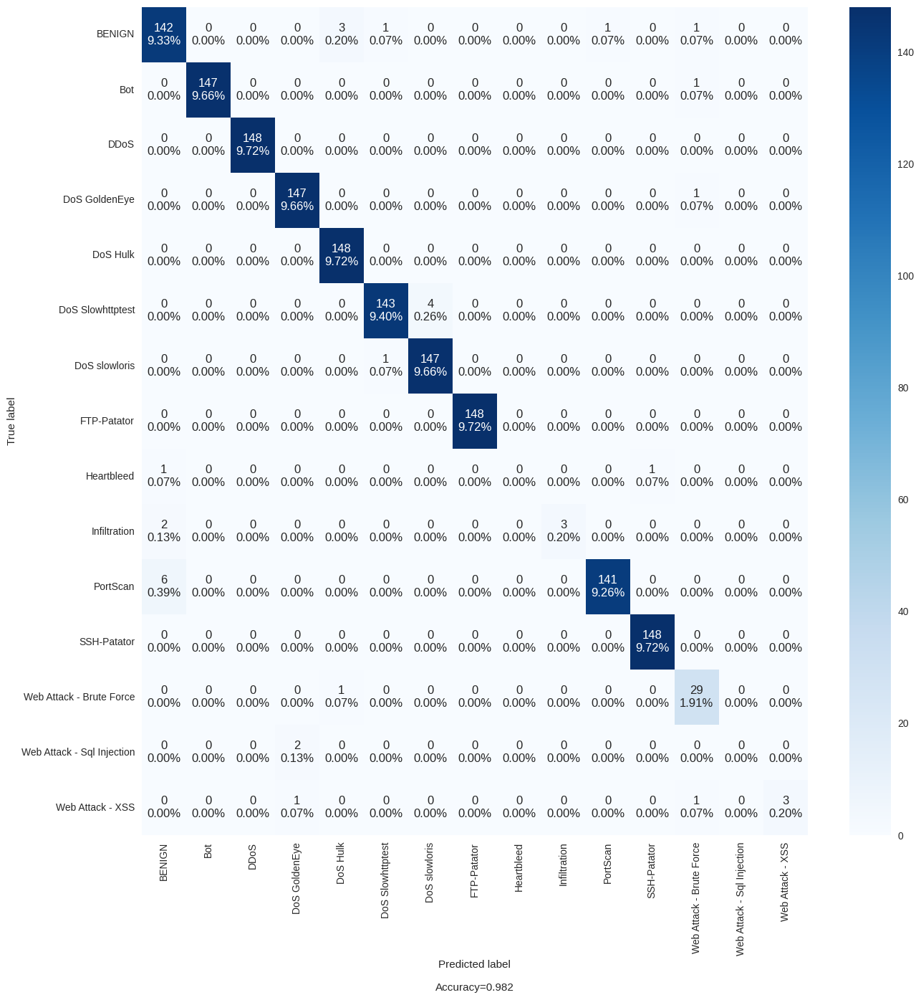

In [100]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [101]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7379415	total: 374ms	remaining: 14.6s
1:	learn: 1.3888601	total: 693ms	remaining: 13.2s
2:	learn: 1.1758196	total: 997ms	remaining: 12.3s
3:	learn: 1.0167956	total: 1.31s	remaining: 11.8s
4:	learn: 0.8966737	total: 1.61s	remaining: 11.3s
5:	learn: 0.7928725	total: 1.94s	remaining: 11s
6:	learn: 0.7116991	total: 2.28s	remaining: 10.7s
7:	learn: 0.6407462	total: 2.61s	remaining: 10.4s
8:	learn: 0.5803498	total: 2.95s	remaining: 10.2s
9:	learn: 0.5274492	total: 3.28s	remaining: 9.84s
10:	learn: 0.4819137	total: 3.6s	remaining: 9.49s
11:	learn: 0.4411825	total: 3.92s	remaining: 9.16s
12:	learn: 0.4054552	total: 4.23s	remaining: 8.79s
13:	learn: 0.3754219	total: 4.57s	remaining: 8.49s
14:	learn: 0.3468893	total: 4.88s	remaining: 8.14s
15:	learn: 0.3204637	total: 5.22s	remaining: 7.83s
16:	learn: 0.3001617	total: 5.55s	remaining: 7.5s
17:	learn: 0.2785928	total: 5.89s	remaining: 7.2s
18:	learn: 0.2618637	total: 6.21s	remaining: 6.87s
19:	learn: 0.2458641	total: 6.54s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.986478,0.981603
1,PRECISION,0.986688,0.977402
2,RECALL,0.986478,0.981603
3,F1 SCORE,0.986233,0.979237


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


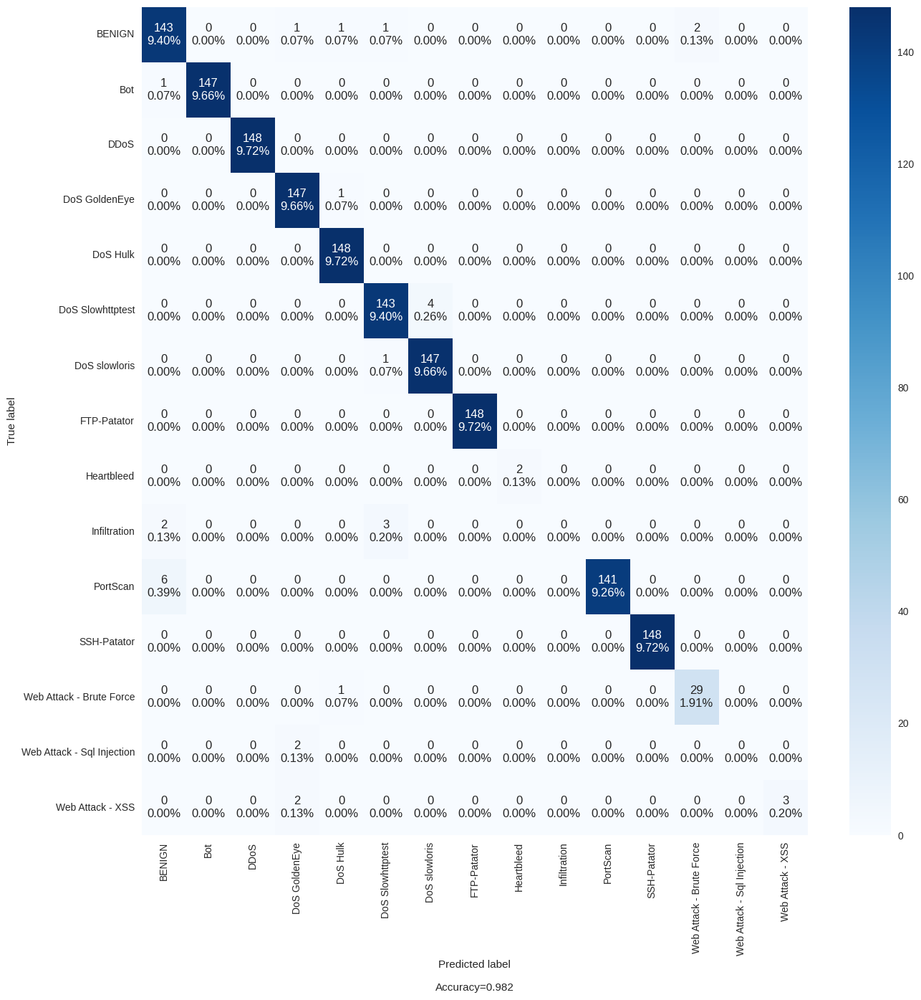

In [102]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [103]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7534535	total: 337ms	remaining: 13.2s
1:	learn: 1.4114027	total: 678ms	remaining: 12.9s
2:	learn: 1.1879756	total: 997ms	remaining: 12.3s
3:	learn: 1.0298701	total: 1.32s	remaining: 11.9s
4:	learn: 0.9019265	total: 1.65s	remaining: 11.5s
5:	learn: 0.8031920	total: 1.97s	remaining: 11.2s
6:	learn: 0.7186184	total: 2.31s	remaining: 10.9s
7:	learn: 0.6464182	total: 2.66s	remaining: 10.6s
8:	learn: 0.5857114	total: 2.99s	remaining: 10.3s
9:	learn: 0.5337548	total: 3.33s	remaining: 9.99s
10:	learn: 0.4904719	total: 3.66s	remaining: 9.64s
11:	learn: 0.4499471	total: 3.98s	remaining: 9.29s
12:	learn: 0.4131279	total: 4.3s	remaining: 8.94s
13:	learn: 0.3792152	total: 4.63s	remaining: 8.61s
14:	learn: 0.3496645	total: 4.96s	remaining: 8.27s
15:	learn: 0.3250088	total: 5.28s	remaining: 7.91s
16:	learn: 0.3028694	total: 5.62s	remaining: 7.6s
17:	learn: 0.2808262	total: 5.94s	remaining: 7.26s
18:	learn: 0.2637020	total: 6.25s	remaining: 6.91s
19:	learn: 0.2459616	total: 6.58s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.987445,0.890276
1,PRECISION,0.987473,0.840034
2,RECALL,0.987445,0.890276
3,F1 SCORE,0.987123,0.857692


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


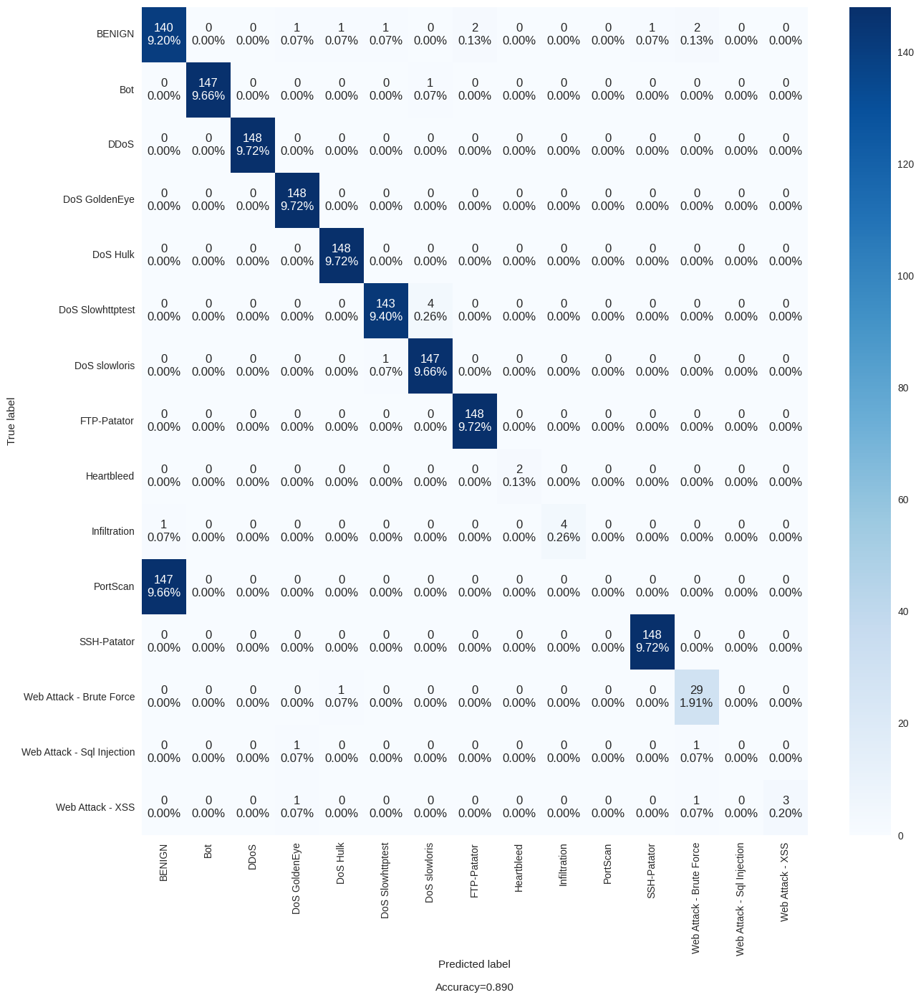

In [104]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [105]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.8143629	total: 344ms	remaining: 13.4s
1:	learn: 1.4386036	total: 663ms	remaining: 12.6s
2:	learn: 1.2023327	total: 1000ms	remaining: 12.3s
3:	learn: 1.0477331	total: 1.32s	remaining: 11.9s
4:	learn: 0.9193344	total: 1.67s	remaining: 11.7s
5:	learn: 0.8134660	total: 2s	remaining: 11.3s
6:	learn: 0.7286155	total: 2.34s	remaining: 11s
7:	learn: 0.6560063	total: 2.68s	remaining: 10.7s
8:	learn: 0.5937016	total: 2.99s	remaining: 10.3s
9:	learn: 0.5417662	total: 3.3s	remaining: 9.89s
10:	learn: 0.4962913	total: 3.62s	remaining: 9.54s
11:	learn: 0.4568423	total: 3.96s	remaining: 9.24s
12:	learn: 0.4205002	total: 4.29s	remaining: 8.91s
13:	learn: 0.3875523	total: 4.64s	remaining: 8.61s
14:	learn: 0.3596368	total: 4.98s	remaining: 8.3s
15:	learn: 0.3346880	total: 5.32s	remaining: 7.97s
16:	learn: 0.3121170	total: 5.65s	remaining: 7.64s
17:	learn: 0.2920303	total: 5.97s	remaining: 7.29s
18:	learn: 0.2755559	total: 6.29s	remaining: 6.95s
19:	learn: 0.2572378	total: 6.61s	remaining: 6.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.982900,0.883706
1,PRECISION,0.983067,0.835074
2,RECALL,0.982900,0.883706
3,F1 SCORE,0.982293,0.851342


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


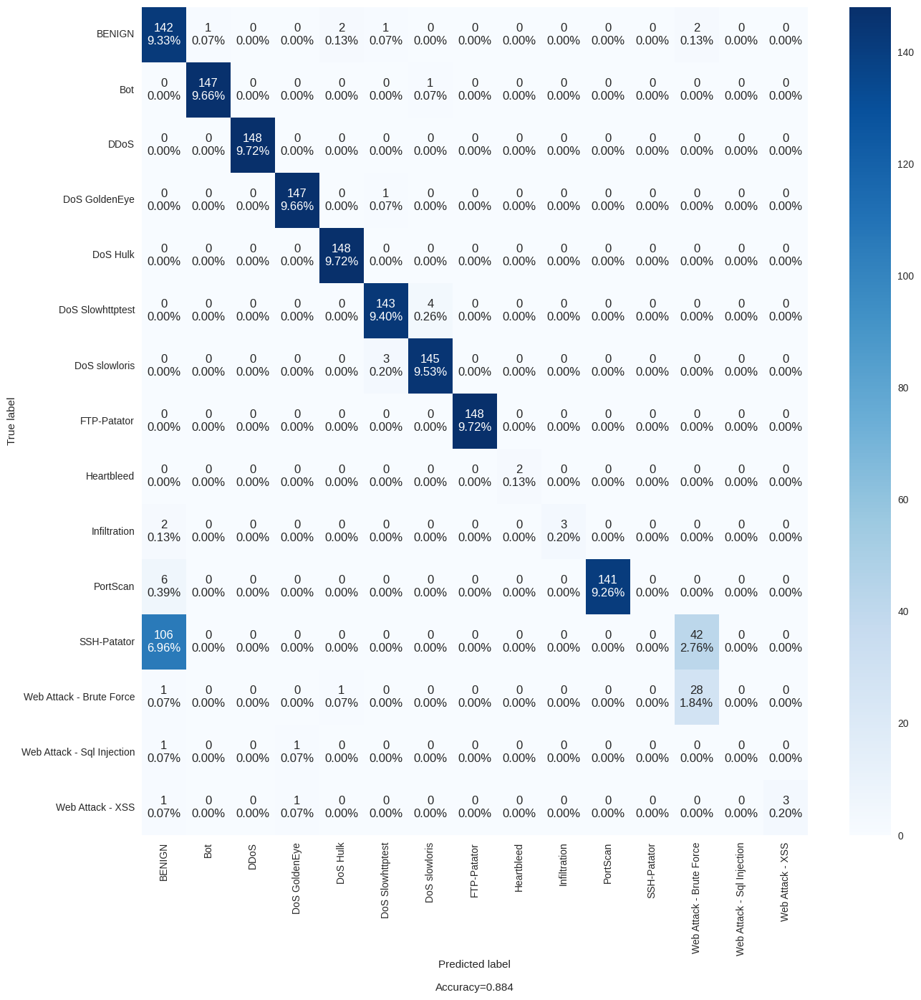

In [106]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [107]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7304016	total: 483ms	remaining: 18.8s
1:	learn: 1.3878055	total: 910ms	remaining: 17.3s
2:	learn: 1.1788862	total: 1.23s	remaining: 15.2s
3:	learn: 1.0158951	total: 1.53s	remaining: 13.8s
4:	learn: 0.8931121	total: 1.85s	remaining: 13s
5:	learn: 0.7915860	total: 2.17s	remaining: 12.3s
6:	learn: 0.7088290	total: 2.48s	remaining: 11.7s
7:	learn: 0.6378229	total: 2.79s	remaining: 11.1s
8:	learn: 0.5798953	total: 3.09s	remaining: 10.6s
9:	learn: 0.5290737	total: 3.39s	remaining: 10.2s
10:	learn: 0.4818471	total: 3.7s	remaining: 9.76s
11:	learn: 0.4400060	total: 4.01s	remaining: 9.37s
12:	learn: 0.4044518	total: 4.33s	remaining: 8.99s
13:	learn: 0.3733910	total: 4.64s	remaining: 8.62s
14:	learn: 0.3435406	total: 4.95s	remaining: 8.25s
15:	learn: 0.3192011	total: 5.26s	remaining: 7.89s
16:	learn: 0.2975870	total: 5.55s	remaining: 7.51s
17:	learn: 0.2771715	total: 5.87s	remaining: 7.17s
18:	learn: 0.2581608	total: 6.18s	remaining: 6.83s
19:	learn: 0.2422745	total: 6.49s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984915,0.962549
1,PRECISION,0.985143,0.946461
2,RECALL,0.984915,0.962549
3,F1 SCORE,0.984487,0.953854


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


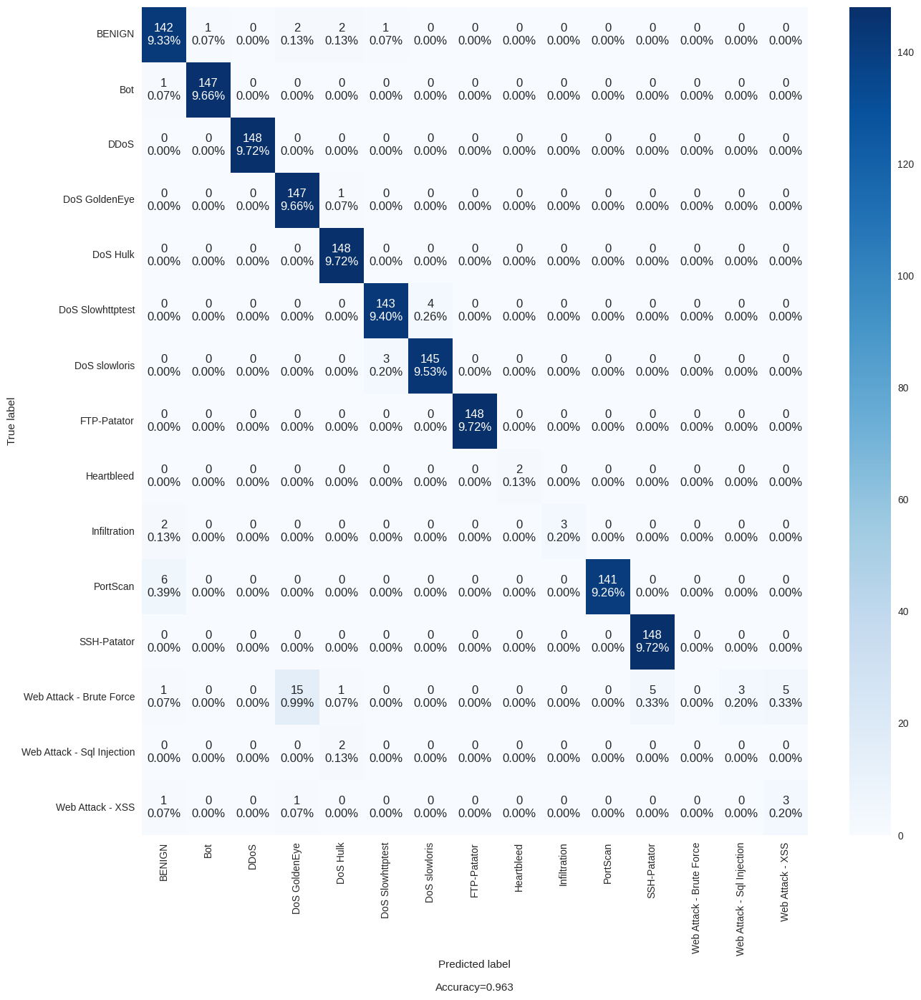

In [108]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [109]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7384717	total: 539ms	remaining: 21s
1:	learn: 1.3868485	total: 883ms	remaining: 16.8s
2:	learn: 1.1664724	total: 1.19s	remaining: 14.7s
3:	learn: 1.0155524	total: 1.5s	remaining: 13.5s
4:	learn: 0.8943791	total: 1.82s	remaining: 12.8s
5:	learn: 0.7909582	total: 2.15s	remaining: 12.2s
6:	learn: 0.7107507	total: 2.46s	remaining: 11.6s
7:	learn: 0.6390410	total: 2.76s	remaining: 11.1s
8:	learn: 0.5791929	total: 3.07s	remaining: 10.6s
9:	learn: 0.5254836	total: 3.39s	remaining: 10.2s
10:	learn: 0.4796402	total: 3.7s	remaining: 9.75s
11:	learn: 0.4387838	total: 4.01s	remaining: 9.37s
12:	learn: 0.4042575	total: 4.33s	remaining: 8.99s
13:	learn: 0.3736798	total: 4.64s	remaining: 8.62s
14:	learn: 0.3439333	total: 4.96s	remaining: 8.27s
15:	learn: 0.3189896	total: 5.27s	remaining: 7.91s
16:	learn: 0.2966237	total: 5.58s	remaining: 7.55s
17:	learn: 0.2760450	total: 5.89s	remaining: 7.2s
18:	learn: 0.2584923	total: 6.2s	remaining: 6.85s
19:	learn: 0.2427719	total: 6.52s	remaining: 6.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984532,0.981603
1,PRECISION,0.984711,0.980507
2,RECALL,0.984532,0.981603
3,F1 SCORE,0.984421,0.980785


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


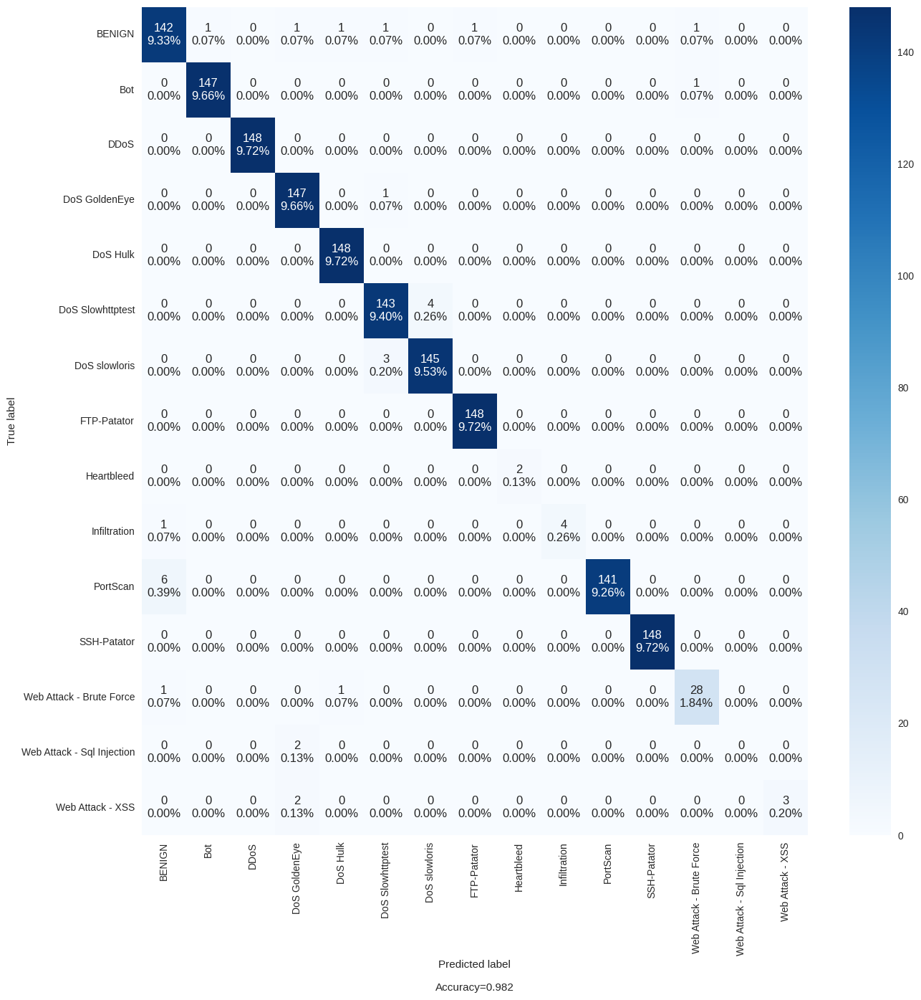

In [110]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [111]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7357433	total: 468ms	remaining: 18.2s
1:	learn: 1.3876837	total: 918ms	remaining: 17.4s
2:	learn: 1.1751372	total: 1.25s	remaining: 15.4s
3:	learn: 1.0155394	total: 1.58s	remaining: 14.3s
4:	learn: 0.8948745	total: 1.92s	remaining: 13.5s
5:	learn: 0.7901655	total: 2.25s	remaining: 12.7s
6:	learn: 0.7050814	total: 2.59s	remaining: 12.2s
7:	learn: 0.6349605	total: 2.91s	remaining: 11.6s
8:	learn: 0.5757463	total: 3.23s	remaining: 11.1s
9:	learn: 0.5229375	total: 3.56s	remaining: 10.7s
10:	learn: 0.4779439	total: 3.88s	remaining: 10.2s
11:	learn: 0.4375798	total: 4.19s	remaining: 9.78s
12:	learn: 0.4019297	total: 4.49s	remaining: 9.33s
13:	learn: 0.3716567	total: 4.8s	remaining: 8.92s
14:	learn: 0.3412131	total: 5.12s	remaining: 8.54s
15:	learn: 0.3166278	total: 5.44s	remaining: 8.16s
16:	learn: 0.2958183	total: 5.76s	remaining: 7.79s
17:	learn: 0.2744849	total: 6.08s	remaining: 7.43s
18:	learn: 0.2576343	total: 6.39s	remaining: 7.07s
19:	learn: 0.2412227	total: 6.7s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984501,0.978318
1,PRECISION,0.984692,0.974450
2,RECALL,0.984501,0.978318
3,F1 SCORE,0.984358,0.976062


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


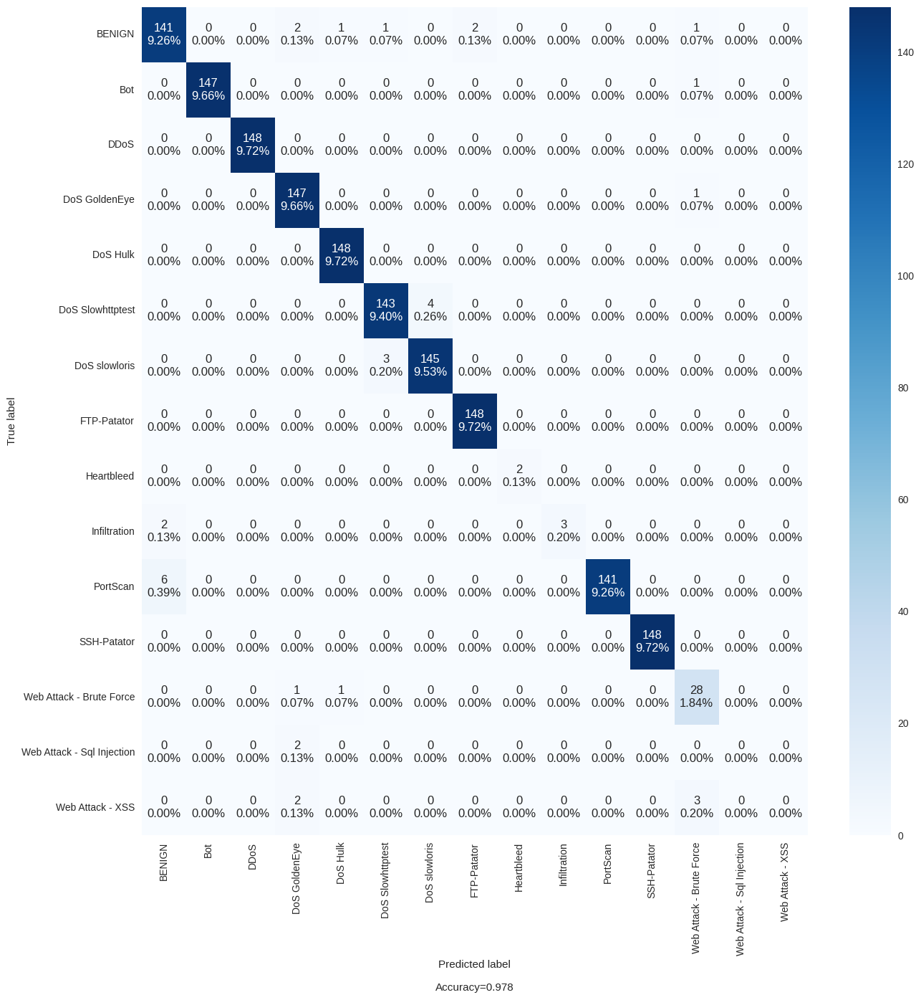

In [112]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))